<b>Authors</b>: <i>Alberto Vavassori (alberto.vavassori@polimi.it), Capizzi Emanuele (emanuele.capizzi@polimi.it) - DICA - Politecnico di Milano - GIS GEOLab. </i>

<i>Developed within the LCZ-ODC project, funded by the Italian Space Agency (agreement n. 2022-30-HH.0) </i>

---
# Co-registration of PRISMA imagery with Sentinel-2 imagery through GeFolki algorithm

This notebook is meant to co-register PRISMA imagery (SWIR and NIR data cubes) using Sentinel-2 pre-processed imagery as reference. <br> 
Co-registration is performed using the Ge-Folki algorithm (reference GitHub page for Geofolki algorithm: [Link](https://github.com/aplyer/gefolki)) which is based on Optical-Flow Computation.

<a id='TOC_TOP'></a>

The main steps implemented in this notebook are the following: <br>
 1. [opening PRISMA file (provided in .he5 format), reading and extracting image data](#sec1)  
 2. [importing the pre-processed Sentinel-2 image clipped to PRISMA image extent (i.e. result obtained through the notebook `1 - S2_Preprocessing.ipynb`) and resample it at 30m resolution](#sec2)
 3. [application of the AROSICS algorithm](#sec3)  
 4. [exporting the original non co-registered PRISMA bands (RGB composite and all NIR/SWIR bands) as well as the co-registered PRISMA bands (RGB composite and all NIR/SWIR bands); the bands combinations are exported in GeoTIFF](#sec4)
 5. [Panchromatic coregistration and export](#sec5)
<hr>

## 1. <a id='sec1'></a>Opening PRISMA file, reading and extracting image data

**REQUIREMENT**: installation of [***h5py***](https://docs.h5py.org/en/stable/quick.html) library from command line with `pip install h5py`.
Libraries required for running the code:
- `h5py`
- `numpy`
- `matplotlib`
- `rasterio`
- `os`
- `pylab`
- `ipwidgets`
- GeFolki functionalities (`EFolki` and `wrapData`)

In [1]:
#Import libraries
import h5py
import numpy as np
import rasterio as rio
from rasterio.plot import show
from rasterio.plot import show_hist
from rasterio.warp import reproject, Resampling
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import pylab as pl
import os
import ipywidgets as widgets
import pandas as pd

# Import Gefolki functionalities
import sys
sys.path.append('python')
from algorithm import EFolki
from tools import wrapData

Open the file containing the PRISMA image (.he5 file):

In [2]:
f = h5py.File('data/PRISMA/PRS_L2D_STD_20230209102412_20230209102416_0001.he5', 'r')

Print the list of keys. Each key can be accessed to explore the image metadata:

In [3]:
list(f.keys())

['HDFEOS', 'HDFEOS INFORMATION', 'Info', 'KDP_AUX']

(Optionally) it is possible to read names and values for root attributes (metadata contained in `HDF5` root):

for attribute in f.attrs:
     print(attribute,f.attrs[attribute])

(Optionally) it is possible to read the names for all attributes (metadata) contained in the `HDF5` Groups. Specific method for reading the values shall be built depending on the specific metadata type (a single value, an array, a matrix, etc):

In [4]:
def printname(name):
     print(name)

f.visit(printname)

HDFEOS
HDFEOS/SWATHS
HDFEOS/SWATHS/GCP attributes
HDFEOS/SWATHS/Geocoding attributes
HDFEOS/SWATHS/Geocoding attributes/Ancillary
HDFEOS/SWATHS/PRS_L2D_HCO
HDFEOS/SWATHS/PRS_L2D_HCO/Data Fields
HDFEOS/SWATHS/PRS_L2D_HCO/Data Fields/SWIR_Cube
HDFEOS/SWATHS/PRS_L2D_HCO/Data Fields/SWIR_PIXEL_L2_ERR_MATRIX
HDFEOS/SWATHS/PRS_L2D_HCO/Data Fields/VNIR_Cube
HDFEOS/SWATHS/PRS_L2D_HCO/Data Fields/VNIR_PIXEL_L2_ERR_MATRIX
HDFEOS/SWATHS/PRS_L2D_HCO/Geocoding Model
HDFEOS/SWATHS/PRS_L2D_HCO/Geolocation Fields
HDFEOS/SWATHS/PRS_L2D_HCO/Geolocation Fields/Latitude
HDFEOS/SWATHS/PRS_L2D_HCO/Geolocation Fields/Longitude
HDFEOS/SWATHS/PRS_L2D_HCO/Geolocation Fields/Time
HDFEOS/SWATHS/PRS_L2D_HCO/Geometric Fields
HDFEOS/SWATHS/PRS_L2D_HCO/Geometric Fields/Observing_Angle
HDFEOS/SWATHS/PRS_L2D_HCO/Geometric Fields/Rel_Azimuth_Angle
HDFEOS/SWATHS/PRS_L2D_HCO/Geometric Fields/Solar_Zenith_Angle
HDFEOS/SWATHS/PRS_L2D_PCO
HDFEOS/SWATHS/PRS_L2D_PCO/Data Fields
HDFEOS/SWATHS/PRS_L2D_PCO/Data Fields/Cube
HDFEOS

List the band wavelengths available in the VNIR cube:

In [5]:
for attr in f.attrs:
    print(attr)

Acquisition_Purpose
Acquisition_Size
Acquisition_Station
Acquisition_Type
Atm_LutGeomInfo_RelativeAzimuth
Atm_LutGeomInfo_SunZenith
Atm_LutGeomInfo_ViewZenith
Atm_Lut_version
Atmo_RTM_info
Atmo_profile_info
Aux_SunEarthDistance
Aux_SunIrradiance
CNM_L2_BINNING
CNM_L2_BIN_ON
CNM_L2_BSEL_ON
CNM_L2_HGRP
CNM_PAN_ACQ
CNM_SWIR_ACQ
CNM_SWIR_SELECT
CNM_VNIR_ACQ
CNM_VNIR_SELECT
Cloudy_pixels_percentage
DEM_info
Epsg_Code
Exit_Code
Frame_Type
GCP_info
ISF_ID_Start
Image_ID
Integration_Time
L1_Processor_Version
L1_Quality_CCPerc
L2ScalePanMax
L2ScalePanMin
L2ScaleSwirMax
L2ScaleSwirMin
L2ScaleVnirMax
L2ScaleVnirMin
L2d_Quality_flags
List_Cw_Swir
List_Cw_Swir_Flags
List_Cw_Vnir
List_Cw_Vnir_Flags
List_Fwhm_Swir
List_Fwhm_Vnir
Main_Electornic_Unit
Map_AOT_accuracy
Map_WV_accuracy
Num_Frames
Number_of_ISF
PANCorruptedFrameList
PAN_ACQ
PAN_Corrupted_Frame_Percentage
PAN_HGRP
PAN_HYP_ACT_RESIDUAL_m
PAN_HYP_ALT_RESIDUAL_m
PAN_HYP_START_SYNC_FRAME
PAN_HYP_START_SYNC_SUBFRAME
PAN_HYP_STOP_SYNC_FRAME
PAN_

In [6]:
vnir_bands = f.attrs['List_Cw_Vnir']
len(vnir_bands)

66

List the band wavelengths available in the SWIR cube:

In [7]:
swir_bands = f.attrs['List_Cw_Swir']
len(swir_bands)

173

In [8]:
print(f"Number of VNIR Bands: {len(vnir_bands)}")

Number of VNIR Bands: 66


In [9]:
print(f"Number of SWIR Bands: {len(swir_bands)}")

Number of SWIR Bands: 173


Bands are stored in the two data cubes from larger to smaller wavelengths, but it is preferable to have them stored inversely. <br>
Therefore, a dictionary is created with keys containing the band number and value containing the wavelength. The first band has the smallest key:

In [10]:
vnir_dict = {}

for i, band in enumerate(vnir_bands):
    vnir_dict[len(vnir_bands) - i] = band

print(vnir_dict)

{66: 0.0, 65: 0.0, 64: 0.0, 63: 977.3654, 62: 967.0267, 61: 956.2715, 60: 944.6273, 59: 934.11206, 58: 923.9502, 57: 913.44507, 56: 902.80164, 55: 892.08093, 54: 881.45605, 53: 870.74255, 52: 859.97314, 51: 849.20996, 50: 838.5272, 49: 827.9195, 48: 817.31104, 47: 806.71106, 46: 796.127, 45: 785.65955, 44: 775.2735, 43: 764.85645, 42: 754.4696, 41: 744.14954, 40: 733.9552, 39: 723.87994, 38: 713.72687, 37: 703.737, 36: 694.12836, 35: 684.13727, 34: 674.46436, 33: 664.8941, 32: 655.41876, 31: 645.9638, 30: 636.6763, 29: 627.77844, 28: 618.72, 27: 609.9582, 26: 601.0144, 25: 592.339, 24: 583.8441, 23: 575.4868, 22: 567.2061, 21: 559.02026, 20: 550.9146, 19: 542.88513, 18: 535.05255, 17: 527.3053, 16: 519.54376, 15: 512.0464, 14: 504.51172, 13: 497.05865, 12: 489.79486, 11: 482.54816, 10: 475.31885, 9: 468.09842, 8: 460.73175, 7: 453.38947, 6: 446.0147, 5: 438.6569, 4: 431.3347, 3: 423.78476, 2: 415.839, 1: 406.9934}


In [11]:
swir_dict = {}

for i, band in enumerate(swir_bands):
    swir_dict[len(swir_bands) - i] = band

print(swir_dict)

{173: 2497.1155, 172: 2490.2192, 171: 2483.793, 170: 2477.055, 169: 2469.6272, 168: 2463.0303, 167: 2456.5857, 166: 2449.1423, 165: 2442.403, 164: 2435.5442, 163: 2428.6677, 162: 2421.2373, 161: 2414.3567, 160: 2407.6045, 159: 2400.036, 158: 2393.0388, 157: 2386.0618, 156: 2378.771, 155: 2371.5522, 154: 2364.5945, 153: 2357.2937, 152: 2349.7915, 151: 2342.8228, 150: 2335.5264, 149: 2327.8242, 148: 2320.8955, 147: 2313.2007, 146: 2305.7227, 145: 2298.6094, 144: 2290.8267, 143: 2283.4934, 142: 2276.0537, 141: 2268.2883, 140: 2260.8665, 139: 2253.1104, 138: 2245.4485, 137: 2237.904, 136: 2230.0076, 135: 2222.4263, 134: 2214.625, 133: 2206.843, 132: 2199.1353, 131: 2191.1003, 130: 2183.4202, 129: 2175.3442, 128: 2167.4849, 127: 2159.564, 126: 2151.3862, 125: 2143.4656, 124: 2135.5103, 123: 2127.3372, 122: 2119.2314, 121: 2111.039, 120: 2102.8213, 119: 2094.6252, 118: 2086.3823, 117: 2077.9915, 116: 2069.7957, 115: 2061.3787, 114: 2053.0078, 113: 2044.6809, 112: 2036.2607, 111: 2027.7267, 1

The following indexes are corresponding to NIR, red, green and blue wavelenghts (Keep the same band notation as ENMAP plugin where these bands have this meaning):

In [12]:
# Index of NIR red, green and blue in the VNIR cube
idx_nir = 51
idx_red = 33
idx_green = 23
idx_blue = 11

In [13]:
print(f"NIR wvl: {vnir_dict[idx_nir]}, \nRed wvl: {vnir_dict[idx_red]}, \nGreen wvl: {vnir_dict[idx_green]}, \nBlue wvl: {vnir_dict[idx_blue]}")

NIR wvl: 849.2099609375, 
Red wvl: 664.8941040039062, 
Green wvl: 575.48681640625, 
Blue wvl: 482.54815673828125


Store the NIR and SWIR keys (band number) in two lists:

In [14]:
vnir_keys = list(vnir_dict.keys())

In [15]:
swir_keys = list(swir_dict.keys())

PRISMA images are stored in the inverse order. So we must obtain the position of the band in the cube (using its index) and use that position to extract the image:

In [16]:
# #Index of the NIR(849 nm - Band 51) Red (660.26361nm - Band 33), Blue (478.1763nm - Band 11), and Green (571.00281nm - Band 23) bands:
idx_nir_prisma = vnir_keys.index(idx_nir)
idx_red_prisma = vnir_keys.index(idx_red)
idx_green_prisma = vnir_keys.index(idx_green)
idx_blue_prisma = vnir_keys.index(idx_blue)
print(f"The NIR band number {idx_nir} has position {idx_nir_prisma}")
print(f"The Red band number {idx_red} has position {idx_red_prisma}")
print(f"The Green band number {idx_green} has position {idx_green_prisma}")
print(f"The Blue band number {idx_blue} has position {idx_blue_prisma}")

The NIR band number 51 has position 15
The Red band number 33 has position 33
The Green band number 23 has position 43
The Blue band number 11 has position 55


Let's read and store attributes and wavelengths (_needed to choose the specific bands_) in separate arrays:

In [17]:
# Attributes
attrs = f.attrs

# Wavelengths (separately for VNIR and SWIR)
vn_wvl = np.array([wvl for wvl in attrs['List_Cw_Vnir']])
sw_wvl = np.array([wvl for wvl in attrs['List_Cw_Swir']])

# #Index of the Red (660.26361nm - Band 33), Blue (478.1763nm - Band 11), and Green (571.00281nm - Band 23) bands:
# idx_red = np.where(vn_wvl == 664.8941)[0][0]
# idx_blue = np.where(vn_wvl == 475.31885)[0][0]
# idx_green = np.where(vn_wvl == 575.4868)[0][0]

In [18]:
vn_wvl

array([  0.     ,   0.     ,   0.     , 977.3654 , 967.0267 , 956.2715 ,
       944.6273 , 934.11206, 923.9502 , 913.44507, 902.80164, 892.08093,
       881.45605, 870.74255, 859.97314, 849.20996, 838.5272 , 827.9195 ,
       817.31104, 806.71106, 796.127  , 785.65955, 775.2735 , 764.85645,
       754.4696 , 744.14954, 733.9552 , 723.87994, 713.72687, 703.737  ,
       694.12836, 684.13727, 674.46436, 664.8941 , 655.41876, 645.9638 ,
       636.6763 , 627.77844, 618.72   , 609.9582 , 601.0144 , 592.339  ,
       583.8441 , 575.4868 , 567.2061 , 559.02026, 550.9146 , 542.88513,
       535.05255, 527.3053 , 519.54376, 512.0464 , 504.51172, 497.05865,
       489.79486, 482.54816, 475.31885, 468.09842, 460.73175, 453.38947,
       446.0147 , 438.6569 , 431.3347 , 423.78476, 415.839  , 406.9934 ],
      dtype=float32)

Let's store the pixel coordinates (latitude and longitude) in two arrays (lat, lon):

In [19]:
data = f['HDFEOS']['SWATHS']['PRS_L2D_HCO']

lat = np.array(data['Geolocation Fields']['Latitude'][:])
lon = np.array(data['Geolocation Fields']['Longitude'][:])

Let's get the spectral information of each data cube and correct the dimensions of the arrays to get depth as the third dimension:

In [20]:
vrf = np.array(data['Data Fields']['VNIR_Cube'][:]) 
srf = np.array(data['Data Fields']['SWIR_Cube'][:]) 
print(vrf.shape)
print(srf.shape)

(1206, 66, 1230)
(1206, 173, 1230)


In [21]:
#move the number of wavelengths to the last position:
vrf = np.moveaxis(vrf, 1, 2)
srf = np.moveaxis(srf, 1, 2)
print(vrf.shape)
print(srf.shape)

(1206, 1230, 66)
(1206, 1230, 173)


Let's now convert the values stored in the data cubes from DN to spectral reflectance. To do so, we need to access the scaling factors availables among the attributes, namely `L2ScaleVnirMax` and `L2ScaleVnirMax` for the NIR cube, and `L2ScaleSwirMax` and `L2ScaleSwirMax` for the SWIR cube. Then, let's apply the formula provided in the documentation:


In [22]:
L2ScaleVnirMax = attrs['L2ScaleVnirMax']
L2ScaleVnirMin = attrs['L2ScaleVnirMin']
L2ScaleSwirMax = attrs['L2ScaleSwirMax']
L2ScaleSwirMin = attrs['L2ScaleSwirMin']
print(f"VNIR min: {L2ScaleVnirMin}, VNIR max: {L2ScaleVnirMax}")
print(f"SWIR min: {L2ScaleSwirMin}, SWIR max: {L2ScaleSwirMax}")

SR_scaler = 65535

vrf_refl = L2ScaleVnirMin + vrf*(L2ScaleVnirMax - L2ScaleVnirMin) / SR_scaler
srf_refl = L2ScaleSwirMin + srf*(L2ScaleSwirMax - L2ScaleSwirMin) / SR_scaler

VNIR min: 0.0, VNIR max: 0.9864950180053711
SWIR min: 0.0, SWIR max: 1.0


Select the NIR, red, green, blue bands from the scaled VNIR cube, and plot them:

In [23]:
nir_band_prisma = vrf_refl[:, :, idx_nir_prisma]
red_band_prisma = vrf_refl[:, :, idx_red_prisma]
green_band_prisma = vrf_refl[:, :, idx_green_prisma]
blue_band_prisma = vrf_refl[:, :, idx_blue_prisma]

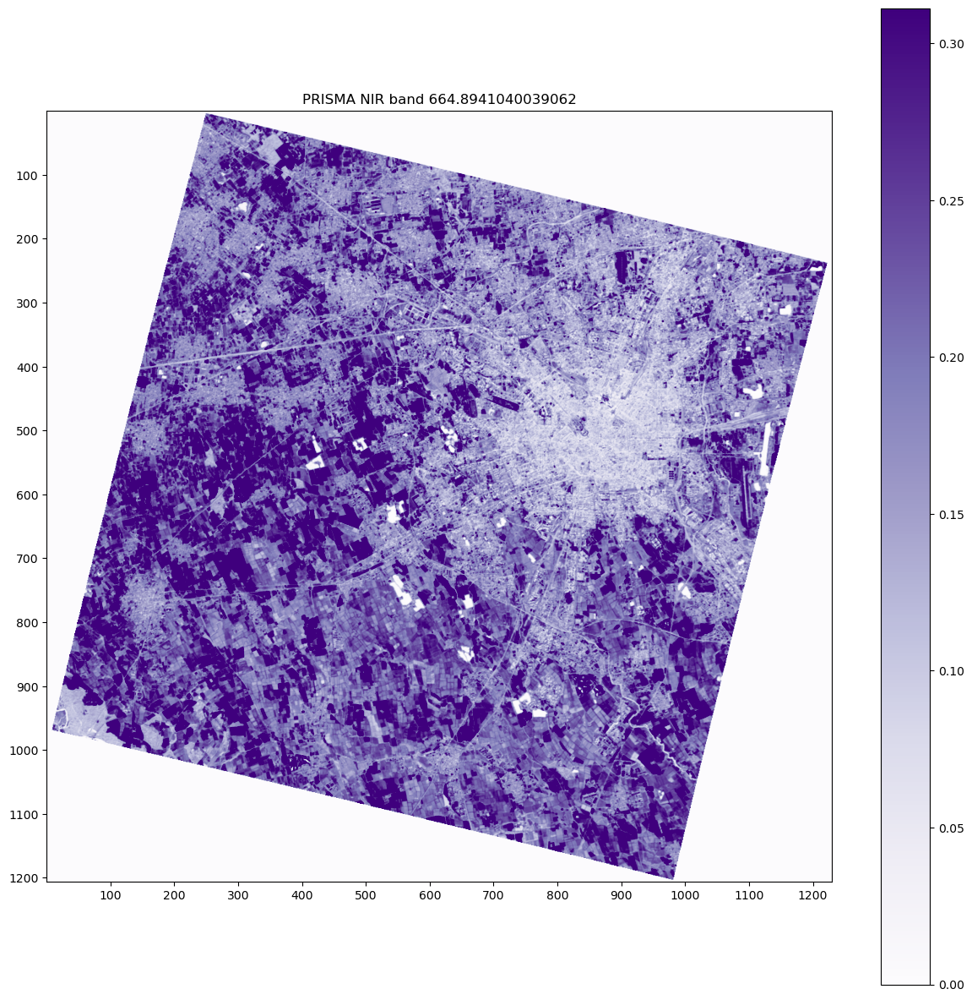

In [24]:
plt.figure(figsize = (15,15))
height, width = nir_band_prisma.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(nir_band_prisma, cmap="Purples", vmin=-np.quantile(nir_band_prisma, 0.1), vmax=np.quantile(nir_band_prisma, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title(f'PRISMA NIR band {vnir_dict[idx_red]}')
plt.colorbar()

'''NIR Band stored in a dedicated array'''
PRISMA_NirBand = nir_band_prisma

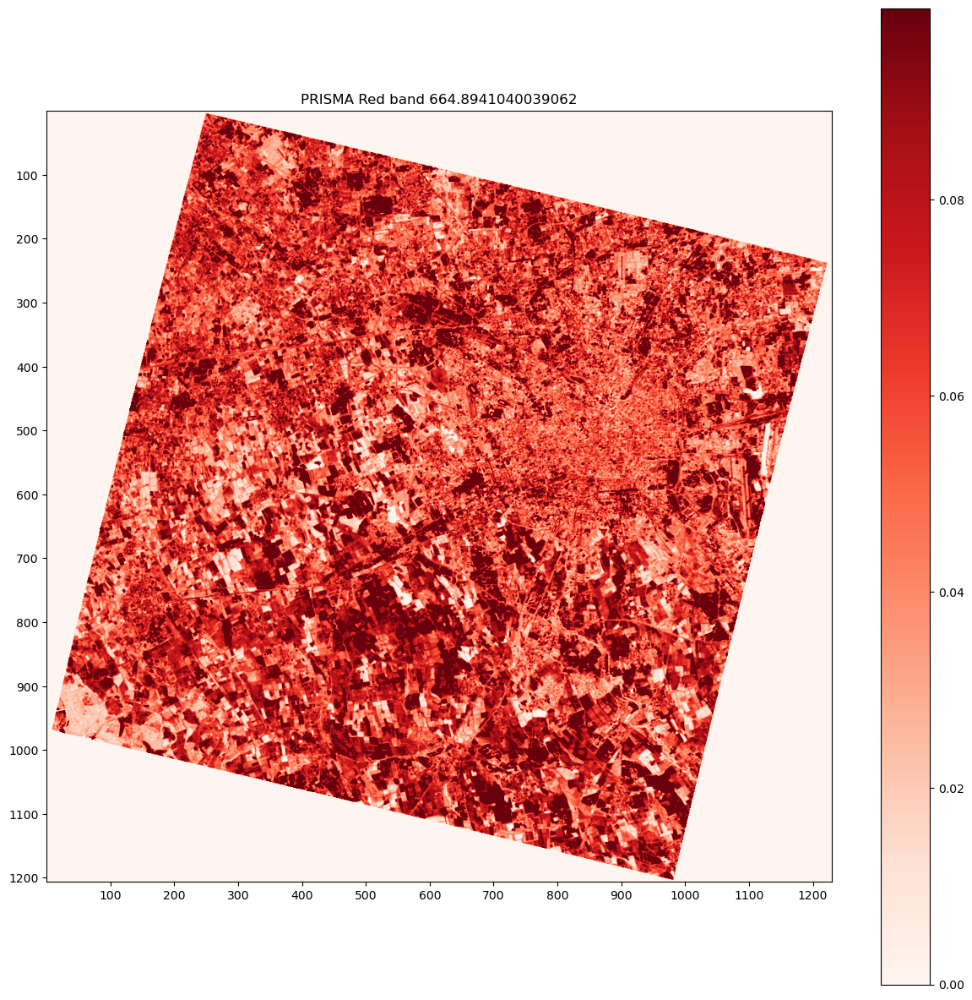

In [25]:
plt.figure(figsize = (15,15))
height, width = red_band_prisma.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(red_band_prisma, cmap="Reds", vmin=-np.quantile(red_band_prisma, 0.1), vmax=np.quantile(red_band_prisma, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title(f'PRISMA Red band {vnir_dict[idx_red]}')
plt.colorbar()

'''Red Band stored in a dedicated array'''
PRISMA_RedBand = red_band_prisma

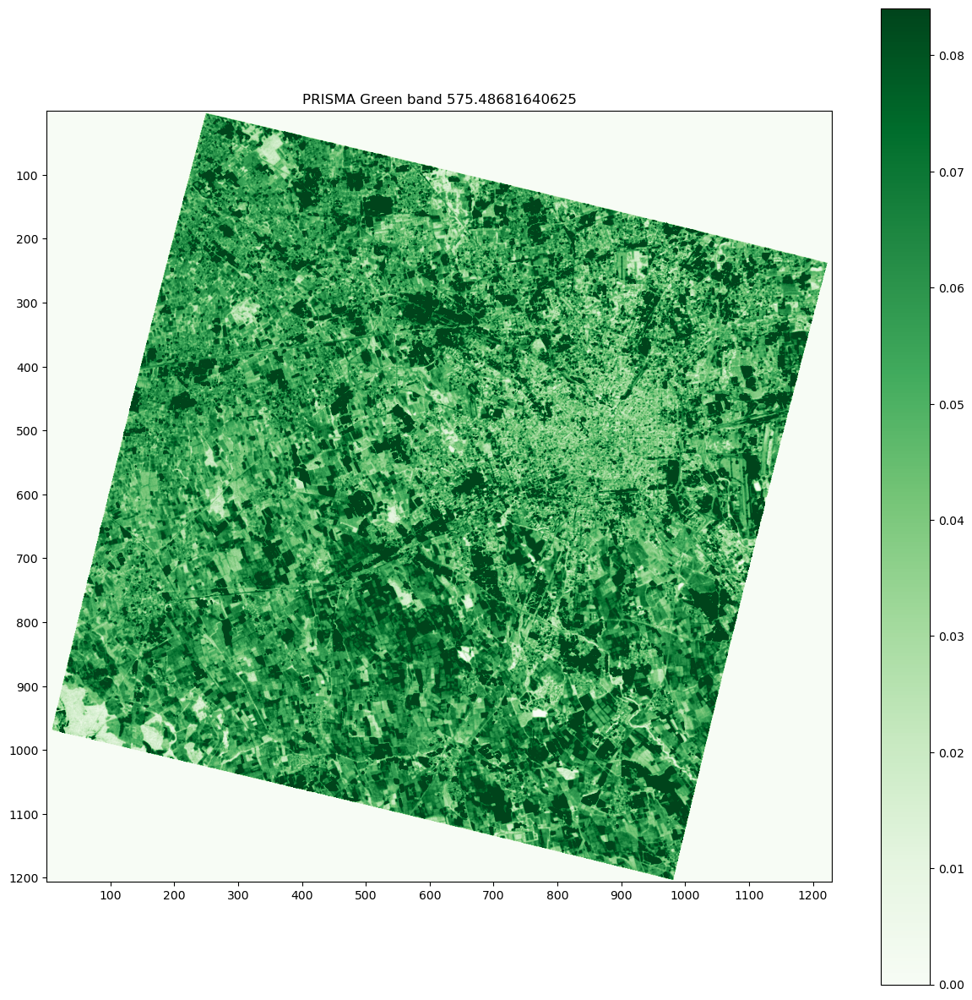

In [26]:
plt.figure(figsize = (15,15))
height, width = green_band_prisma.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(green_band_prisma, cmap="Greens", vmin=-np.quantile(green_band_prisma, 0.1), vmax=np.quantile(green_band_prisma, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title(f'PRISMA Green band {vnir_dict[idx_green]}')
plt.colorbar()

'''Red Band stored in a dedicated array'''
PRISMA_GreenBand = green_band_prisma

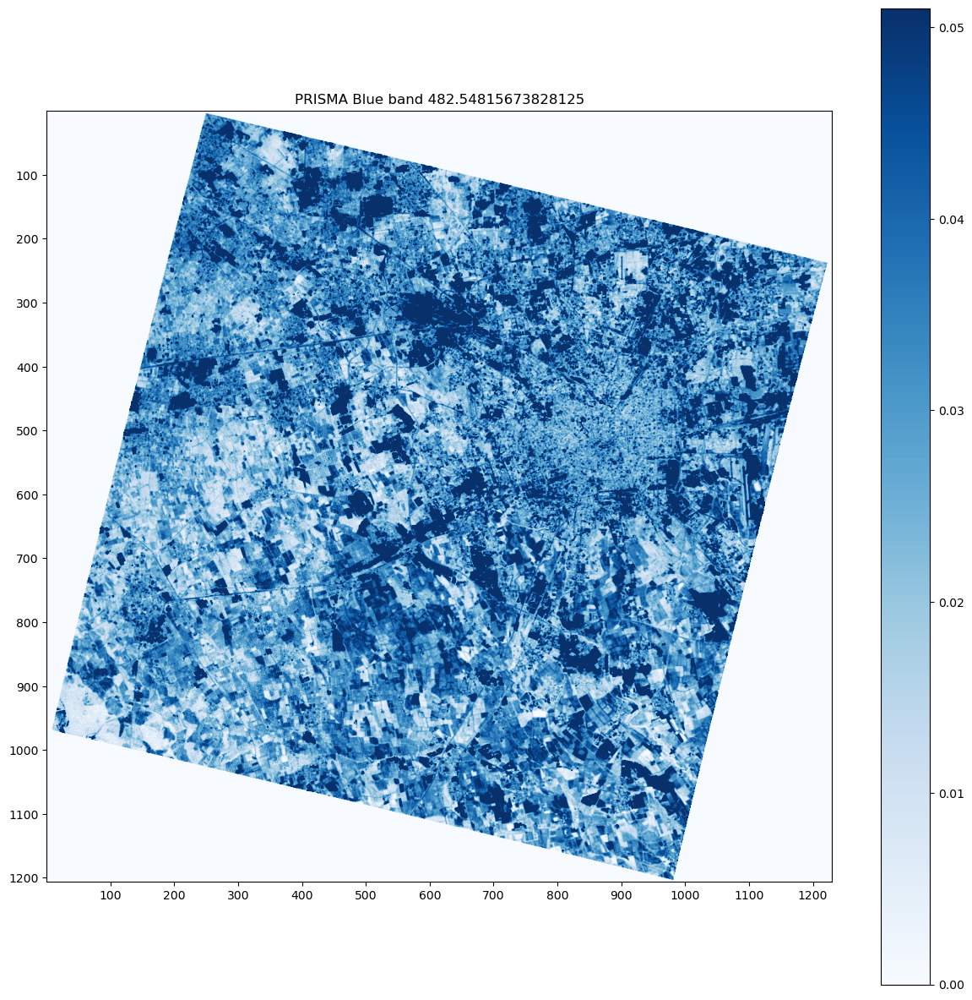

In [27]:
plt.figure(figsize = (15,15))
height, width = blue_band_prisma.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(blue_band_prisma, cmap="Blues", vmin=-np.quantile(blue_band_prisma, 0.1), vmax=np.quantile(blue_band_prisma, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title(f'PRISMA Blue band {vnir_dict[idx_blue]}')
plt.colorbar()

'''Blue Band stored in a dedicated array'''
PRISMA_BlueBand = blue_band_prisma

## 2. <a id='sec2'></a>Importing the pre-processed Sentinel-2 image clipped to PRISMA image extent and resample it at 30m resolution
[Back to top](#TOC_TOP)

Let's import the pre-processed Sentinel-2 image (result of the first notebook `1 - S2_Preprocessing.ipynb`)

In [41]:
s2_path = "data/S2Clipped/s2_clipped_Q.tif"
S2clipped=rio.open(s2_path)
S2clipped.shape

(1797, 1824)

To scale Sentinel-2 to reflectance:

In [42]:
S2_scale = 10000

In [43]:
with rio.open(s2_path) as src:
    # Read the data from the red, green, and blue bands
    data = src.read() / S2_scale  #indexes=[4, 3, 2]
    # Get the metadata of the source image
    src_meta = src.meta

Define the output desired resolution:

In [44]:
dst_resolution = 30

Get transform parameters from the input image:

In [45]:
src.transform[:]

(19.99474819078945,
 0.0,
 488994.254,
 0.0,
 -19.994748191430162,
 5050248.2041,
 0.0,
 0.0,
 1.0)

Update to new resolution the parameters:

In [46]:
dst_meta = src_meta.copy()
dst_meta.update({
    'height': int(src.height * src.transform[0] / dst_resolution),
    'width': int(src.width * src.transform[0] / dst_resolution),
    'transform': rio.Affine(dst_resolution, 0, src.bounds.left, 0, -dst_resolution, src.bounds.top),
    'dtype' : 'float32'
})

Resample using a **bilinear** interpolation with rasterio.reproject (it is possible to change the interpolation method):

In [47]:
resampled_data = np.zeros((src.count, dst_meta['height'], dst_meta['width']), dtype=data.dtype)
reproject(data,resampled_data,src_transform=src.transform,src_crs=src.crs, dst_transform=dst_meta['transform'], dst_crs=src.crs, resampling=Resampling.bilinear)

(array([[[3.3999998e+34, 3.3999998e+34, 3.3999998e+34, ...,
          3.3999998e+34, 3.3999998e+34, 3.3999998e+34],
         [3.3999998e+34, 3.3999998e+34, 3.3999998e+34, ...,
          3.3999998e+34, 3.3999998e+34, 3.3999998e+34],
         [3.3999998e+34, 3.3999998e+34, 3.3999998e+34, ...,
          3.3999998e+34, 3.3999998e+34, 3.3999998e+34],
         ...,
         [3.3999998e+34, 3.3999998e+34, 3.3999998e+34, ...,
          3.3999998e+34, 3.3999998e+34, 3.3999998e+34],
         [3.3999998e+34, 3.3999998e+34, 3.3999998e+34, ...,
          3.3999998e+34, 3.3999998e+34, 3.3999998e+34],
         [3.3999998e+34, 3.3999998e+34, 3.3999998e+34, ...,
          3.3999998e+34, 3.3999998e+34, 3.3999998e+34]],
 
        [[3.3999998e+34, 3.3999998e+34, 3.3999998e+34, ...,
          3.3999998e+34, 3.3999998e+34, 3.3999998e+34],
         [3.3999998e+34, 3.3999998e+34, 3.3999998e+34, ...,
          3.3999998e+34, 3.3999998e+34, 3.3999998e+34],
         [3.3999998e+34, 3.3999998e+34, 3.3999998e+34, 

Save the resampled raster to a 30 m GeoTIFF file:

In [50]:
s2_30_path = "data/S2Clipped/30m__clip.tif"
# S2clipped=rio.open(s2_30_path)
# S2clipped.shape

In [51]:
with rio.open(s2_30_path, 'w', **dst_meta) as dst:
    dst.write(resampled_data)

In [52]:
sentinel_file = rio.open(s2_30_path)

Sentinel2_NirBand = sentinel_file.read(4)
Sentinel2_RedBand = sentinel_file.read(3)
Sentinel2_GreenBand = sentinel_file.read(2)
Sentinel2_BlueBand = sentinel_file.read(1)

In [53]:
sentinel_file.shape

(1197, 1215)

Plot Sentinel-2 Bands:

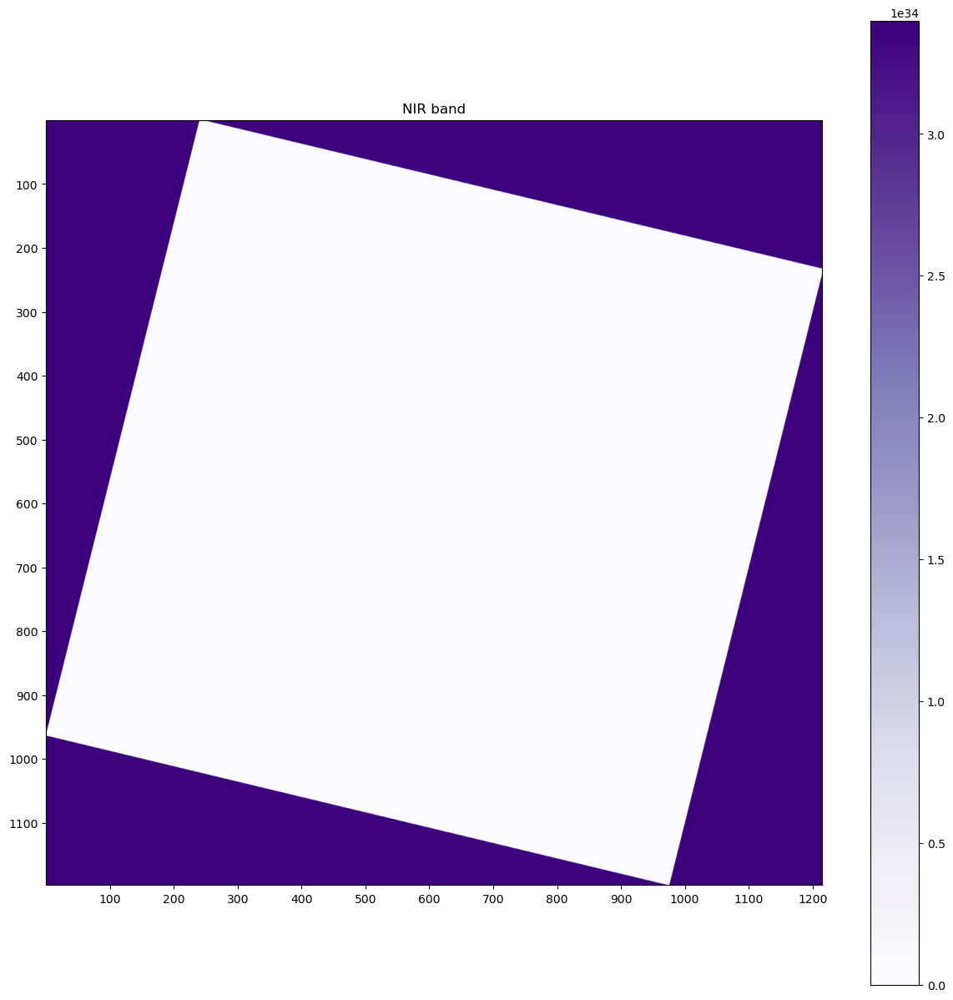

In [54]:
plt.figure(figsize = (15,15))
height, width = Sentinel2_NirBand.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(Sentinel2_NirBand, cmap="Purples", vmin=-np.quantile(Sentinel2_NirBand, 0.1), vmax=np.quantile(Sentinel2_NirBand, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title('NIR band')
plt.colorbar()

In [ ]:
plt.figure(figsize = (15,15))
height, width = Sentinel2_RedBand.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(Sentinel2_RedBand, cmap="Reds", vmin=-np.quantile(Sentinel2_RedBand, 0.1), vmax=np.quantile(Sentinel2_RedBand, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title('Red band')
plt.colorbar()

In [ ]:
plt.figure(figsize = (15,15))
height, width = Sentinel2_GreenBand.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(Sentinel2_GreenBand, cmap="Greens", vmin=-np.quantile(Sentinel2_GreenBand, 0.1), vmax=np.quantile(Sentinel2_GreenBand, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title('Green band')
plt.colorbar()

In [ ]:
plt.figure(figsize = (15,15))
height, width = Sentinel2_BlueBand.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(Sentinel2_BlueBand, cmap="Blues", vmin=-np.quantile(Sentinel2_BlueBand, 0.1), vmax=np.quantile(Sentinel2_BlueBand, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title('Blue band')
plt.colorbar()

### Export NOT coregistered PRISMA imagery (Red-Green-Blue-NIR) - RGBN

In [55]:
kwargs = {}
kwargs['driver'] = 'GTiff'
kwargs['dtype'] = 'float32'
kwargs['count'] = 4
kwargs['width'] = vrf_refl.shape[1]
kwargs['height'] = srf_refl.shape[0]
kwargs['dtype'] = 'float32'
kwargs['crs'] = rio.crs.CRS.from_epsg(32632)
kwargs['transform'] = rio.transform.Affine(dst_resolution, src.transform[1],src.transform[2], src.transform[3], -dst_resolution, src.transform[5])

In [ ]:
# # Create a new raster file RGB (change the count number)
# with rio.open('rgb_PRISMA_NOTcoreg_image.tif', 'w', **kwargs) as dst:
#     # Write the RGB data to the raster file
#     dst.write(red_band_prisma, 1)
#     dst.write(green_band_prisma, 2)
#     dst.write(blue_band_prisma, 3)

In [56]:
# Create a new raster file RGBN
with rio.open('data/PRISMA/prisma_all_bands_NOTcoreg.tif', 'w', **kwargs) as dst:
    # Write the RGB data to the raster file
    dst.write(red_band_prisma, 1)
    dst.write(green_band_prisma, 2)
    dst.write(blue_band_prisma, 3)
    dst.write(nir_band_prisma, 4)

## 3. <a id='sec3'></a>Application of AROSICS algorithm
[Back to top](#TOC_TOP)

INTRO TO AROSICS


Firstly, let's define the parameters required by the algorithm. These values yield good results, however, it is possible to tune them !


In [ ]:
# iteration = 4
# radius = [100, 100]
# rank = 4
# level = 5

In [ ]:
# bands_dict_PRISMA = {'Blue':PRISMA_BlueBand,
#              'Green':PRISMA_GreenBand,
#              'Red':PRISMA_RedBand,
#              'NIR':PRISMA_NirBand}

# bands_dict_S2 = {'Blue':Sentinel2_BlueBand,
#              'Green':Sentinel2_GreenBand,
#              'Red':Sentinel2_RedBand,
#              'NIR':Sentinel2_NirBand}

It is possible to select the S2 and PRISMA bands to be used for coregistration. There are no noticeable differences between the use of differents bands as long as they are corresponding (e.g. PRISMA red band with S2 red band):

In [ ]:
# w_band = widgets.RadioButtons(
#     options=['Blue', 'Green', 'Red', 'NIR'],
#     description='Select band for coregistration:',
#     disabled=False,
#     value='Red')
# w_band

In [ ]:
# band_sel = w_band.value
# print(f"The band selected for coregistration is: {band_sel}")

The following piece of code applies the algorithm. The result is the estimated horizontal (u) and vertical (v) displacement. (REMINDER: the zeros outside the PRISMA image are intentionally left. Using np.nan gives some issues when processing with GeFolki algorithm):

In [64]:
#band coregistration
from arosics import COREG_LOCAL

crkwargs = {
    'grid_res'     : 30,
    'window_size'  : (64,64),
    'path_out'     : 'auto',
    'tieP_filter_level':3,
    'min_reliability': 0,
    'q'            : False,
}
# PRISMA_mask = bands_dict_PRISMA[band_sel]>0
# sentinel_mask = bands_dict_S2[band_sel]>0

# PRISMA_Band = bands_dict_PRISMA[band_sel]
refrence_path = "data/S2Clipped/s2_clip.tif"
s2=rio.open(refrence_path)
s2.shape
# with rio.open(refrence_path, 'w', **dst_meta) as dst:
#     dst.write(PRISMA_Band,indexes=1)
# Sentinel2_Band = bands_dict_S2[band_sel]
target_path = "data/PRISMA/prisma_all_bands_NOTcoreg.tif"
prisma=rio.open(target_path)
prisma.shape
# with rio.open(target_path, 'w', **dst_meta) as dst:
#     dst.write(Sentinel2_Band,indexes=1)

# u, v = EFolki(Sentinel2_Band, PRISMA_Band, iteration=iteration, radius=radius, rank=rank, levels=level)
CRL = COREG_LOCAL(refrence_path,
                  target_path,
                  **crkwargs)
CRL.correct_shifts()


c:\Users\Osama\miniconda3\envs\gepro\Lib\site-packages\numpy\core\_methods.py:181: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
Polygonize progress     |===-----------------------------------------------| 5.0% Complete  => 0:00:00

Calculating footprint polygon and actual data corner coordinates for reference image...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00


Bounding box of calculated footprint for reference image:
	(488994.2539999997, 5014317.6416, 525464.6747011681, 5050248.2041)
Automatically detected nodata value for GeoArray_CoReg 'prisma_all_bands_NOTcoreg': 0.0
Calculating footprint polygon and actual data corner coordinates for image to be shifted...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00


Bounding box of calculated footprint for image to be shifted:
	(489234.254, 5014158.2041, 525654.254, 5050158.2041)
Matching window position (X,Y): 507330.9591702586/5032254.77225753
Initializing tie points grid...


Warping progress     |========------------------------------------------| 16.0% Complete  => 0:00:00

Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00


Calculating tie point grid (1096 points) using 4 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:01:19


Found 60 matches.
Performing validity checks...
0 tie points flagged by level 1 filtering (reliability).
2 tie points flagged by level 2 filtering (SSIM).


c:\Users\Osama\miniconda3\envs\gepro\Lib\site-packages\arosics\Tie_Point_Grid.py:1196: FutureWarning: `random_state` is a deprecated argument name for `ransac`. It will be removed in version 0.23. Please use `rng` instead.
  ransac((src_coords, est_coords),


7 tie points flagged by level 3 filtering (RANSAC)
51 valid tie points remain after filtering.
Automatically detected nodata value for GeoArray 'prisma_all_bands_NOTcoreg': 0.0
Correcting geometric shifts...


c:\Users\Osama\miniconda3\envs\gepro\Lib\site-packages\arosics\DeShifter.py:291: UserWarning: 
The coordinate grid of prisma_all_bands_NOTcoreg cannot be aligned to the desired grid because their pixel sizes are not exact multiples of each other (input [X/Y]: 30.0/30.0; desired [X/Y]: 19.99474819144234/19.99474819097668). Therefore the original grid is chosen for the resampled output image. If you don´t like that you can use the 'out_gsd' or 'match_gsd' parameters to set an appropriate output pixel size or to allow changing the pixel size.

  warnings.warn("\nThe coordinate grid of %s cannot be aligned to the desired grid because their pixel "
Translating progress |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:01


Writing GeoArray of size (1206, 1230, 4) to c:\Users\Osama\Documents\GitHub\GeoinformaticsProject\data\PRISMA\prisma_all_bands_NOTcoreg__shifted_to__s2_clip.bsq.


OrderedDict([('band', None),
             ('is shifted', True),
             ('is resampled', True),
             ('updated map info',
              ['UTM',
               1.0,
               1.0,
               488994.254,
               5050248.2041,
               30.0,
               30.0,
               32,
               'North',
               'WGS-84']),
             ('updated geotransform',
              (488994.254, 30.0, 0.0, 5050248.2041, 0.0, -30.0)),
             ('updated projection',
              'PROJCS["WGS 84 / UTM zone 32N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",9],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHO

Check `u` and `v` vectors calculated by GeFolki algorithm, to show the tranformation applied:

In [65]:
# u.shape

CRL.show_image_footprints()

visualize tie point grid with shifts present AFTER shift correction

The remaining shifts after local correction can be calculated and visualized by instanciating the arosics.COREG_LOCAL with the output path of the above instance of COREG_LOCAL.

Note: array has been downsampled to 1000 x 985 for faster visualization.


c:\Users\Osama\miniconda3\envs\gepro\Lib\site-packages\numpy\core\_methods.py:215: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


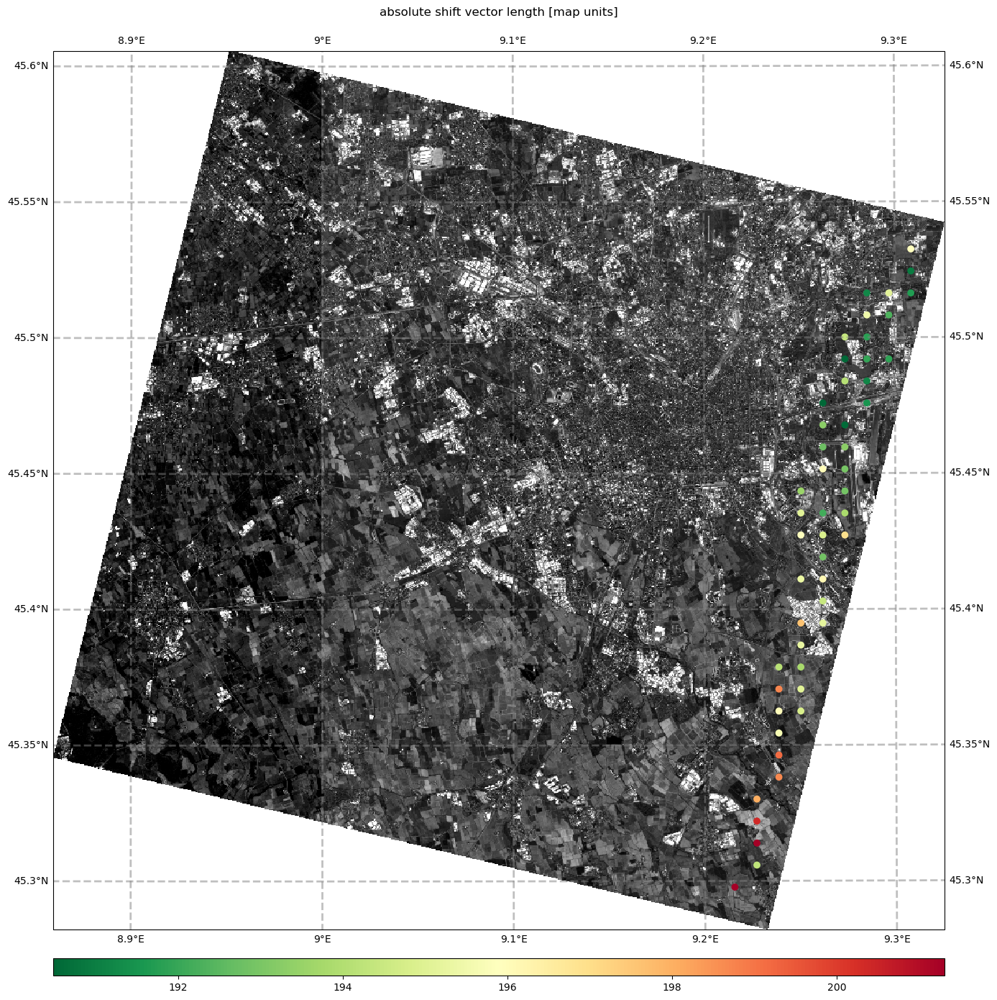

In [67]:
CRL.view_CoRegPoints(figsize=(15,15), backgroundIm='ref')

show the points table of the calculated tie point grid

In [96]:
CRL.CoRegPoints_table

,geometry,POINT_ID,X_IM,Y_IM,X_MAP,Y_MAP,REF_BADDATA,TGT_BADDATA,X_WIN_SIZE,Y_WIN_SIZE,...,SSIM_BEFORE,SSIM_AFTER,SSIM_IMPROVED,RELIABILITY,LAST_ERR,L1_OUTLIER,L2_OUTLIER,L3_OUTLIER,OUTLIER,xRisiduals
0,POINT (497094.254 5049348.204),51,270,30,497094.254,5.049348e+06,False,False,36.0,34.0,...,-9999.0,-9999.0,-9999,-9999.0,The calculated shift (X: -8.252190544674498 px...,-9999,-9999,-9999,-9999,10269.0
1,POINT (497994.254 5049348.204),52,300,30,497994.254,5.049348e+06,False,False,24.0,22.0,...,-9999.0,-9999.0,-9999,-9999.0,No match found in the given window.,-9999,-9999,-9999,-9999,10299.0
2,POINT (498894.254 5049348.204),53,330,30,498894.254,5.049348e+06,False,False,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999,-9999.0,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999,10329.0
3,POINT (499794.254 5049348.204),54,360,30,499794.254,5.049348e+06,False,False,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999,-9999.0,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999,10359.0
4,POINT (496194.254 5048448.204),92,240,60,496194.254,5.048448e+06,False,False,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999,-9999.0,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999,10239.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1091,POINT (517794.254 5016048.204),1628,960,1140,517794.254,5.016048e+06,False,False,46.0,46.0,...,-9999.0,-9999.0,-9999,-9999.0,The calculated shift (X: -4.347262369431959 px...,-9999,-9999,-9999,-9999,10959.0
1092,POINT (515094.254 5015148.204),1667,870,1170,515094.254,5.015148e+06,False,False,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999,-9999.0,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999,10869.0
1093,POINT (515994.254 5015148.204),1668,900,1170,515994.254,5.015148e+06,False,False,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999,-9999.0,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999,10899.0
1094,POINT (516894.254 5015148.204),1669,930,1170,516894.254,5.015148e+06,False,False,26.0,24.0,...,-9999.0,-9999.0,-9999,-9999.0,No match found in the given window.,-9999,-9999,-9999,-9999,10929.0


In [91]:
CRL.CoRegPoints_table.columns

Index(['geometry', 'POINT_ID', 'X_IM', 'Y_IM', 'X_MAP', 'Y_MAP', 'REF_BADDATA',
       'TGT_BADDATA', 'X_WIN_SIZE', 'Y_WIN_SIZE', 'X_SHIFT_PX', 'Y_SHIFT_PX',
       'X_SHIFT_M', 'Y_SHIFT_M', 'ABS_SHIFT', 'ANGLE', 'SSIM_BEFORE',
       'SSIM_AFTER', 'SSIM_IMPROVED', 'RELIABILITY', 'LAST_ERR', 'L1_OUTLIER',
       'L2_OUTLIER', 'L3_OUTLIER', 'OUTLIER', 'xRisiduals'],
      dtype='object')

c:\Users\Osama\miniconda3\envs\gepro\Lib\site-packages\numpy\core\_methods.py:181: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
Polygonize progress     |=-------------------------------------------------| 2.0% Complete  => 0:00:00

Calculating footprint polygon and actual data corner coordinates for reference image...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00


Bounding box of calculated footprint for reference image:
	(488994.2539999997, 5014317.6416, 525464.6747011681, 5050248.2041)
Calculating footprint polygon and actual data corner coordinates for image to be shifted...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00


Bounding box of calculated footprint for image to be shifted:
	(488994.254, 5014308.2041, 525534.254, 5050068.2041)
Matching window position (X,Y): 507230.1028134971/5032252.420610234
Note: array has been downsampled to 1000 x 985 for faster visualization.
Initializing tie points grid...


c:\Users\Osama\miniconda3\envs\gepro\Lib\site-packages\numpy\core\_methods.py:215: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)
Warping progress     |============--------------------------------------| 24.1% Complete  => 0:00:00

Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00


Calculating tie point grid (1098 points) using 4 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:01:42


Found 824 matches.
Performing validity checks...
0 tie points flagged by level 1 filtering (reliability).
129 tie points flagged by level 2 filtering (SSIM).


c:\Users\Osama\miniconda3\envs\gepro\Lib\site-packages\arosics\Tie_Point_Grid.py:1196: FutureWarning: `random_state` is a deprecated argument name for `ransac`. It will be removed in version 0.23. Please use `rng` instead.
  ransac((src_coords, est_coords),


86 tie points flagged by level 3 filtering (RANSAC)
609 valid tie points remain after filtering.


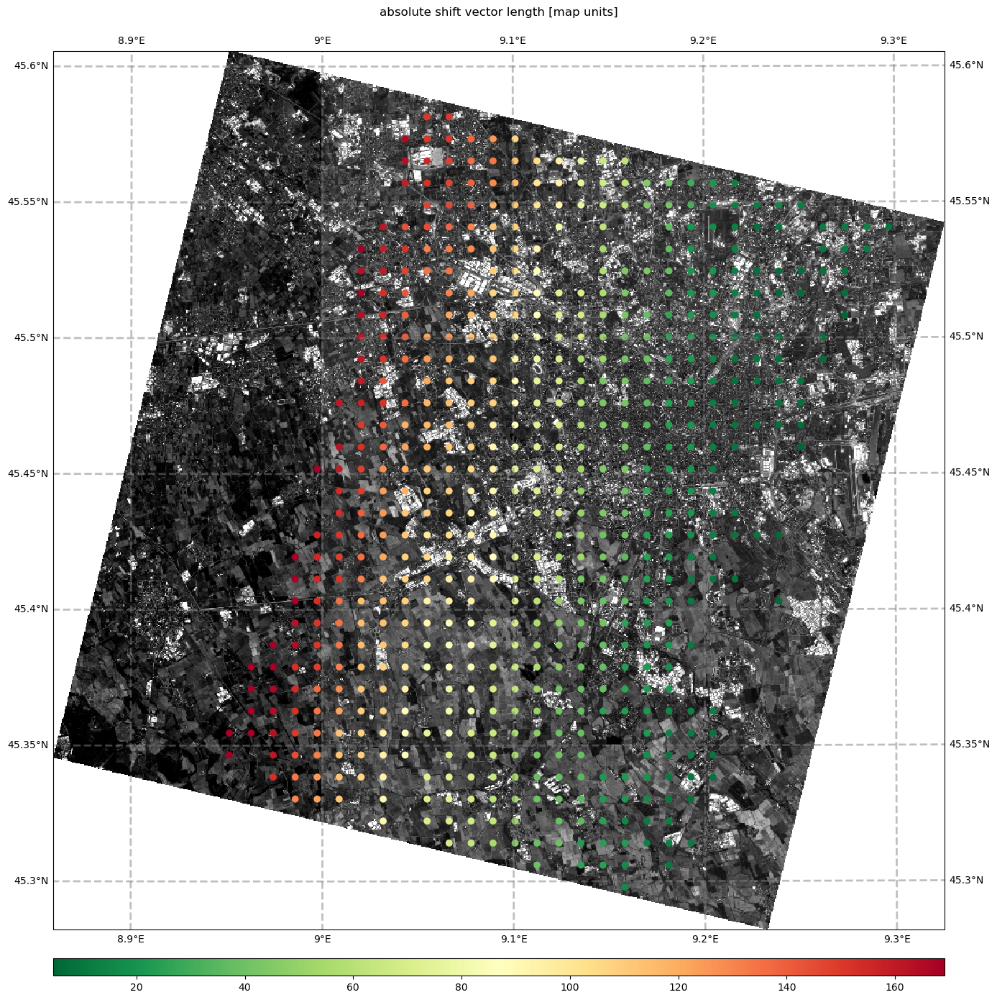

In [70]:
CRL_after_corr = COREG_LOCAL(refrence_path, CRL.path_out, **crkwargs)
CRL_after_corr.view_CoRegPoints(figsize=(15,15),backgroundIm='ref')

In [100]:
CRL_after_corr.CoRegPoints_table

,geometry,POINT_ID,X_IM,Y_IM,X_MAP,Y_MAP,REF_BADDATA,TGT_BADDATA,X_WIN_SIZE,Y_WIN_SIZE,...,ANGLE,SSIM_BEFORE,SSIM_AFTER,SSIM_IMPROVED,RELIABILITY,LAST_ERR,L1_OUTLIER,L2_OUTLIER,L3_OUTLIER,OUTLIER
0,POINT (496194.254 5049348.204),50,240,30,496194.254,5.049348e+06,False,False,-9999.0,-9999.0,...,-9999.000000,-9999.000000,-9999.000000,-9999,-9999.000000,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999
1,POINT (497094.254 5049348.204),51,270,30,497094.254,5.049348e+06,False,False,26.0,24.0,...,-9999.000000,-9999.000000,-9999.000000,-9999,-9999.000000,No match found in the given window.,-9999,-9999,-9999,-9999
2,POINT (497994.254 5049348.204),52,300,30,497994.254,5.049348e+06,False,False,-9999.0,-9999.0,...,-9999.000000,-9999.000000,-9999.000000,-9999,-9999.000000,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999
3,POINT (498894.254 5049348.204),53,330,30,498894.254,5.049348e+06,False,False,-9999.0,-9999.0,...,-9999.000000,-9999.000000,-9999.000000,-9999,-9999.000000,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999
4,POINT (496194.254 5048448.204),92,240,60,496194.254,5.048448e+06,False,False,22.0,22.0,...,-9999.000000,-9999.000000,-9999.000000,-9999,-9999.000000,The matching window became too small for calcu...,-9999,-9999,-9999,-9999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1093,POINT (517794.254 5016048.204),1628,960,1140,517794.254,5.016048e+06,False,False,46.0,46.0,...,132.819394,0.619493,0.606221,False,61.548634,-9999,False,True,False,True
1094,POINT (515094.254 5015148.204),1667,870,1170,515094.254,5.015148e+06,False,False,-9999.0,-9999.0,...,-9999.000000,-9999.000000,-9999.000000,-9999,-9999.000000,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999
1095,POINT (515994.254 5015148.204),1668,900,1170,515994.254,5.015148e+06,False,False,-9999.0,-9999.0,...,-9999.000000,-9999.000000,-9999.000000,-9999,-9999.000000,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999
1096,POINT (516894.254 5015148.204),1669,930,1170,516894.254,5.015148e+06,False,False,26.0,24.0,...,281.075719,0.876144,0.859039,False,31.346285,-9999,False,True,False,True


It is noticed that after correction there are no residuals in the output data

In [101]:
CRL_after_corr.CoRegPoints_table.columns

Index(['geometry', 'POINT_ID', 'X_IM', 'Y_IM', 'X_MAP', 'Y_MAP', 'REF_BADDATA',
       'TGT_BADDATA', 'X_WIN_SIZE', 'Y_WIN_SIZE', 'X_SHIFT_PX', 'Y_SHIFT_PX',
       'X_SHIFT_M', 'Y_SHIFT_M', 'ABS_SHIFT', 'ANGLE', 'SSIM_BEFORE',
       'SSIM_AFTER', 'SSIM_IMPROVED', 'RELIABILITY', 'LAST_ERR', 'L1_OUTLIER',
       'L2_OUTLIER', 'L3_OUTLIER', 'OUTLIER'],
      dtype='object')

In [74]:
CRL.tiepoint_grid.calc_overall_stats()

{'N_TP': 60,
 'N_VALID_TP': 51,
 'N_INVALID_TP': 9,
 'PERC_VALID_TP': 85.0,
 'RMSE_M': 194.5811810073161,
 'RMSE_X_M': 136.215985370372,
 'RMSE_Y_M': 138.94977989108327,
 'RMSE_X_PX': 4.540532845678905,
 'RMSE_Y_PX': 4.631659329701343,
 'MSE_M': 37861.83600220191,
 'MSE_X_M': 18554.7946704214,
 'MSE_Y_M': 19307.041331780485,
 'MSE_X_PX': 20.61643852268898,
 'MSE_Y_PX': 21.452268146409494,
 'MAE_M': 194.56239103436056,
 'MAE_X_M': 136.05550167941163,
 'MAE_Y_M': 138.79844695552453,
 'MAE_X_PX': 4.535183389313561,
 'MAE_Y_PX': 4.626614898516114,
 'MEAN_ABS_SHIFT': 194.56239103436056,
 'MEAN_X_SHIFT_M': -136.05550167941163,
 'MEAN_Y_SHIFT_M': 138.79844695552453,
 'MEAN_X_SHIFT_PX': -4.535183389313562,
 'MEAN_Y_SHIFT_PX': -4.626614898516114,
 'MEAN_ANGLE': 135.572728364435,
 'MEAN_SSIM_BEFORE': 0.15692662227864645,
 'MEAN_SSIM_AFTER': 0.748339861620597,
 'MEAN_RELIABILITY': 66.03670422302082,
 'MEDIAN_ABS_SHIFT': 194.3985401562308,
 'MEDIAN_X_SHIFT_M': -133.78461662848713,
 'MEDIAN_Y_SHIFT

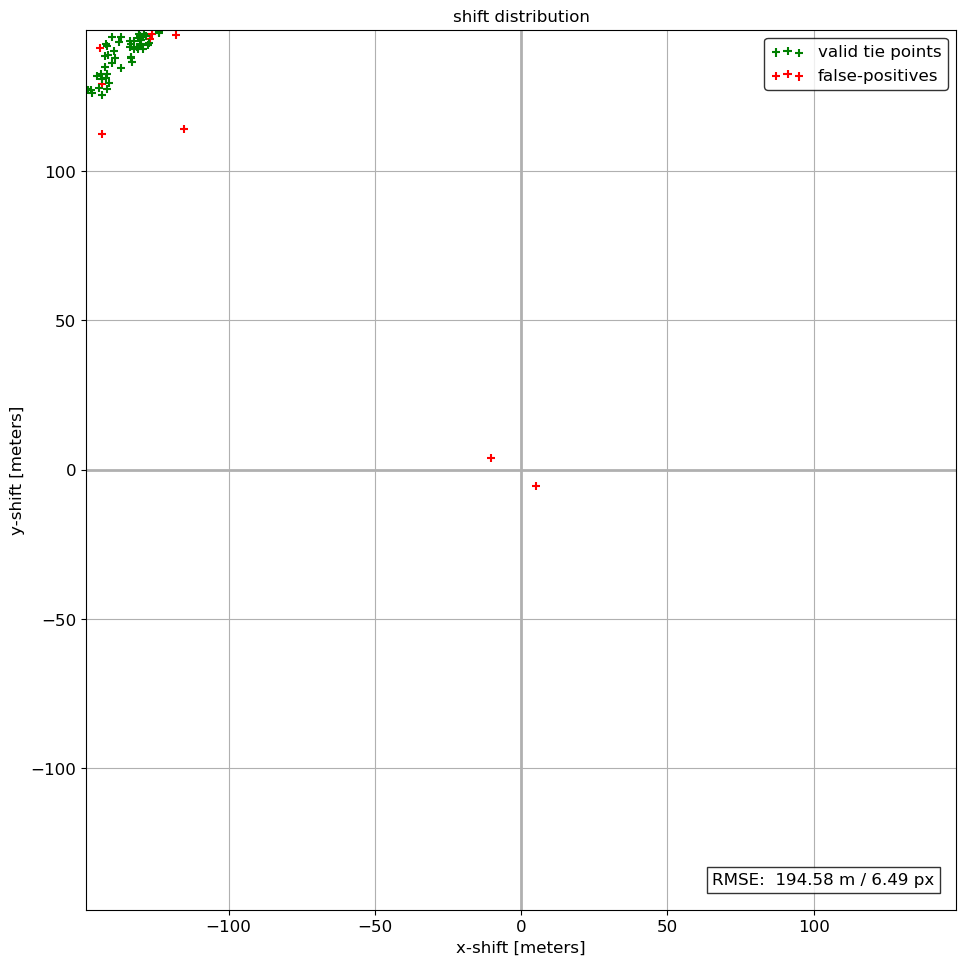

In [78]:
CRL.tiepoint_grid.plot_shift_distribution(include_outliers=True)

In [102]:
CRL_after_corr.tiepoint_grid.calc_overall_stats()

{'N_TP': 824,
 'N_VALID_TP': 609,
 'N_INVALID_TP': 215,
 'PERC_VALID_TP': 73.90776699029125,
 'RMSE_M': 89.13549746539987,
 'RMSE_X_M': 76.54979626318556,
 'RMSE_Y_M': 45.66470847896746,
 'RMSE_X_PX': 2.5516598754395172,
 'RMSE_Y_PX': 1.522156949299065,
 'MSE_M': 7945.136908404306,
 'MSE_X_M': 5859.871307935218,
 'MSE_Y_M': 2085.2656004690825,
 'MSE_X_PX': 6.510968119928013,
 'MSE_Y_PX': 2.316961778299436,
 'MAE_M': 73.88133365600648,
 'MAE_X_M': 64.70564605213364,
 'MAE_Y_M': 33.495053100652,
 'MAE_X_PX': 2.1568548684044426,
 'MAE_Y_PX': 1.1165017700221203,
 'MEAN_ABS_SHIFT': 73.88133365600655,
 'MEAN_X_SHIFT_M': 64.17775922684284,
 'MEAN_Y_SHIFT_M': 31.407672553511308,
 'MEAN_X_SHIFT_PX': 2.1392586408947554,
 'MEAN_Y_SHIFT_PX': -1.0469224184502024,
 'MEAN_ANGLE': 246.85614956239806,
 'MEAN_SSIM_BEFORE': 0.34166111073683975,
 'MEAN_SSIM_AFTER': 0.7026791248940844,
 'MEAN_RELIABILITY': 66.79350539838238,
 'MEDIAN_ABS_SHIFT': 69.67672968454484,
 'MEDIAN_X_SHIFT_M': 66.63785017363261,
 '

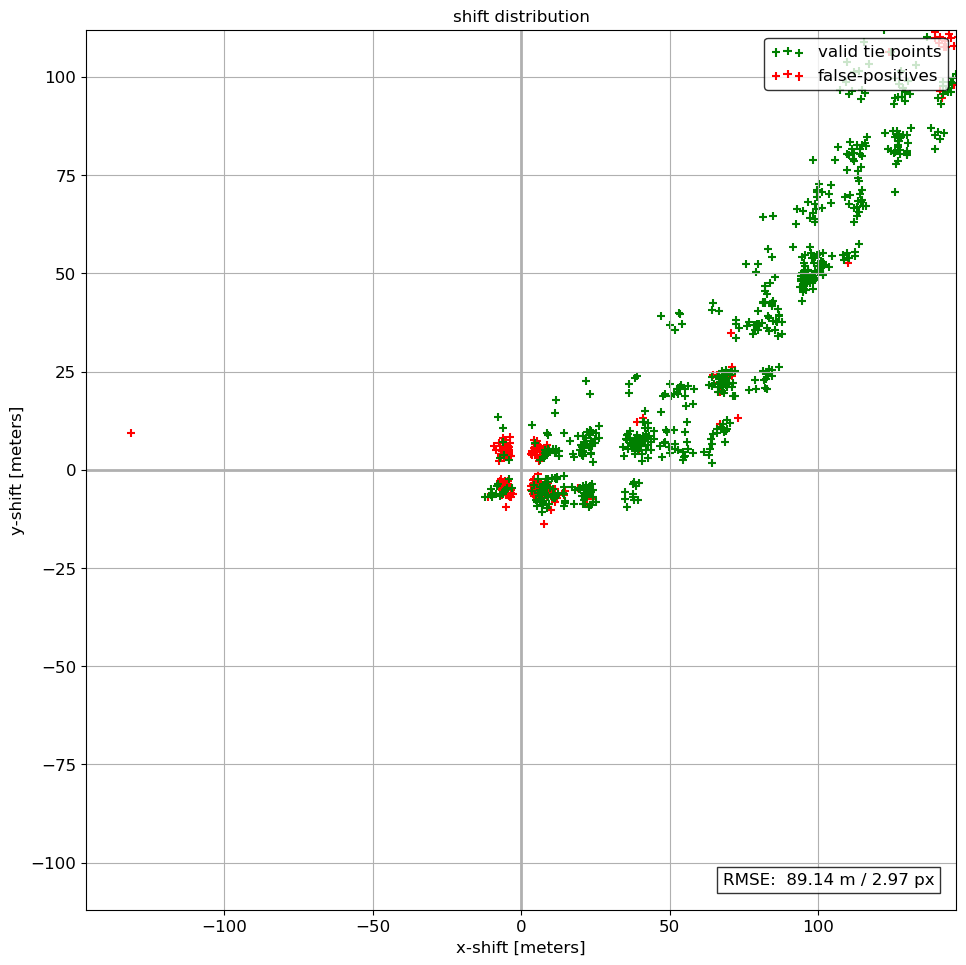

In [97]:
CRL_after_corr .tiepoint_grid.plot_shift_distribution(include_outliers=True)

In [84]:
CRL.tiepoint_grid.calc_rmse()

194.5811810073161

In [98]:
CRL_after_corr.tiepoint_grid.calc_rmse()

89.13549746539987

In [82]:
CRL.tiepoint_grid.mean_x_shift_px


-4.366984099144462

In [103]:
CRL_after_corr.tiepoint_grid.mean_x_shift_px

1.8364635353288827

In [83]:
CRL.tiepoint_grid.mean_y_shift_px

-4.450157191872708

In [104]:
CRL_after_corr.tiepoint_grid.mean_y_shift_px

-0.9534479740898198

Shift before coregistration

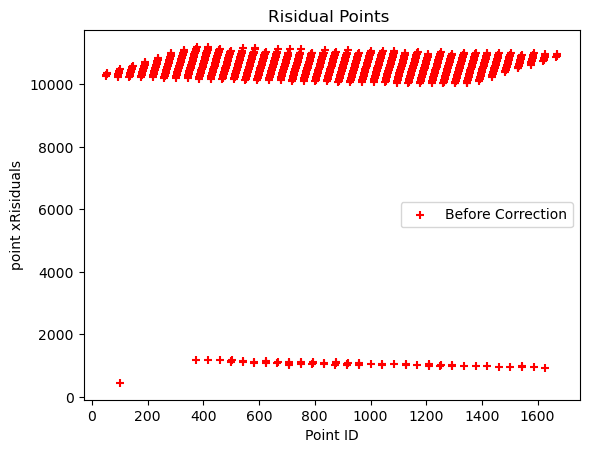

In [108]:
plt.scatter(CRL.CoRegPoints_table[[ 'POINT_ID']] , CRL.CoRegPoints_table[[ 'xRisiduals']], label='Before Correction',marker='+', c='r',)
plt.xlabel('Point ID')
plt.ylabel('point xRisiduals')
plt.title('Risidual Points ')
plt.legend()
plt.show()

In [99]:
# CRL.CoRegPoints_table[[ 'L1_OUTLIER']].plot
# plt.scatter(CRL.CoRegPoints_table[[ 'L1_OUTLIER']],CRL.CoRegPoints_table[['L2_OUTLIER']] )
# df=pd.DataFrame(CRL.CoRegPoints_table[[ 'SSIM_BEFORE']],[['SSIM_AFTER']] )
# CRL.CoRegPoints_table.plot
# def diff(a, b):
#     return b - a
# CRL.CoRegPoints_table[[ 'xRisiduals']]= CRL.CoRegPoints_table.apply(
#     lambda x: diff(CRL.CoRegPoints_table[[ 'X_IM']], CRL.CoRegPoints_table[[ 'X_SHIFT_PX']]), axis=1)
CRL.CoRegPoints_table[[ 'xRisiduals']]=CRL.CoRegPoints_table[[ 'X_IM']].values-CRL.CoRegPoints_table[[ 'X_SHIFT_PX']].values
x = CRL.CoRegPoints_table[[ 'POINT_ID']]   # Set the x-axis values
# print(CRL.CoRegPoints_table[[ 'xRisiduals']].size)
# print(x.size)
# print(CRL.CoRegPoints_table[[ 'X_SHIFT_PX']].size)


rmse_before =sorted(CRL.CoRegPoints_table[[ 'xRisiduals']].values)  # Fill in the RMSE values before correction
rmse_after = CRL.CoRegPoints_table[[ 'X_IM']]  # Fill in the RMSE values after correction
# Create a line plot with two lines: one for RMSE before correction and one for RMSE after correction:
plt.scatter(CRL_after_corr.CoRegPoints_table[[ 'POINT_ID']] , CRL_after_corr.CoRegPoints_table[[ 'xRisiduals']], label='Before Correction',marker='+', c='r',)
# plt.plot(x, rmse_after, label='After Correction')
# Customize the plot with labels, title, and legend:
plt.xlabel('Point ID')
plt.ylabel('point risiduals')
plt.title('Risidual Points ')
plt.legend()
# Display the plot:
plt.show()
# plt.show()


KeyError: "None of [Index(['xRisiduals'], dtype='object')] are in the [columns]"

In [ ]:
# # CRL.CoRegPoints_table[[ 'L1_OUTLIER']].plot
# # plt.scatter(CRL.CoRegPoints_table[[ 'L1_OUTLIER']],CRL.CoRegPoints_table[['L2_OUTLIER']] )
# # df=pd.DataFrame(CRL.CoRegPoints_table[[ 'SSIM_BEFORE']],[['SSIM_AFTER']] )
# # CRL.CoRegPoints_table.plot
# # def diff(a, b):
# #     return b - a
# # CRL.CoRegPoints_table[[ 'xRisiduals']]= CRL.CoRegPoints_table.apply(
# #     lambda x: diff(CRL.CoRegPoints_table[[ 'X_IM']], CRL.CoRegPoints_table[[ 'X_SHIFT_PX']]), axis=1)
# CRL.CoRegPoints_table[[ 'yRisiduals']]=CRL.CoRegPoints_table[[ 'ABS_SHIFT']]
# x = CRL.CoRegPoints_table[[ 'POINT_ID']]   # Set the x-axis values
# # print(CRL.CoRegPoints_table[[ 'xRisiduals']].size)
# # print(x.size)
# # print(CRL.CoRegPoints_table[[ 'X_SHIFT_PX']].size)


# rmse_before =sorted(CRL.CoRegPoints_table[[ 'yRisiduals']].values)  # Fill in the RMSE values before correction
# rmse_after = CRL.CoRegPoints_table[[ 'SSIM_AFTER']]  # Fill in the RMSE values after correction
# # Create a line plot with two lines: one for RMSE before correction and one for RMSE after correction:
# plt.scatter(x, rmse_before, label='Before Correction')
# # plt.plot(x, rmse_after, label='After Correction')
# # Customize the plot with labels, title, and legend:
# plt.xlabel('shift risiduals')
# plt.ylabel('Point index (m)')
# plt.title('RMSE Before ')
# plt.legend()
# # Display the plot:
# plt.show()
# # plt.show()


In [ ]:
# # afunction to calculate RMSE
# def calculate_rmse(detected_shifts_before, detected_shifts_after):
#     # Convert the lists to numpy arrays
#     before = np.array(detected_shifts_before)
#     after = np.array(detected_shifts_after)
    
#     # Calculate the squared differences between before and after
#     squared_diff = np.square(after - before)
    
#     # Calculate the mean of the squared differences
#     mean_squared_diff = np.mean(squared_diff)
    
#     # Calculate the RMSE by taking the square root of the mean squared difference
#     rmse = np.sqrt(mean_squared_diff)
    
#     return rmse

In [ ]:
# detected_shifts_before=CRL.CoRegPoints_table[['SSIM_BEFORE']]
# detected_shifts_after=CRL.CoRegPoints_table[[ 'SSIM_AFTER']]
# rmse_result=calculate_rmse(detected_shifts_before, detected_shifts_after)
# print(f"RMSE Result: {rmse_result:.2f}")

Let's now apply the estimated vectors `u` and `v` to all the NIR and SWIR bands of the PRISMA image. For doing so, let's first initialize two new datacubes (one for NIR, the other for SWIR) that will store the coregistered image. Then, let's fill the new datacubes with the coregistered data (applying the optical flow transformation to each band). Finally, let's concatenate the two datacubes.

In [ ]:
# PRISMArecalee_vrf = np.zeros(vrf.shape)
# PRISMArecalee_srf = np.zeros(srf.shape)

In [ ]:
# for idx, band in enumerate(vn_wvl):
#     PRISMArecalee_vrf[:, :, idx] = wrapData(vrf_refl[:, :, idx], u, v)

In [ ]:
# for idx, band in enumerate(sw_wvl):
#     PRISMArecalee_srf[:, :, idx] = wrapData(srf_refl[:, :, idx], u, v)

Masks for the coregistered and not coregistered imagery

In [ ]:
# Mask for coregistered imagery
outside_mask_coreg = np.amax(PRISMArecalee_vrf, axis=2).astype(float)
outside_mask_coreg[outside_mask_coreg != 0] = 1
outside_mask_coreg[outside_mask_coreg == 0] = np.nan
plt.imshow(outside_mask_coreg)

In [ ]:
# Mask for NOT coregistered imagery
outside_mask_not_coreg = np.amax(vrf, axis=2).astype(float)
outside_mask_not_coreg[outside_mask_not_coreg != 0] = 1
outside_mask_not_coreg[outside_mask_not_coreg == 0] = np.nan
plt.imshow(outside_mask_not_coreg)

In [ ]:
# Create a meshgrid for the coordinates
X, Y = np.meshgrid(np.arange(0, v.shape[1]), np.arange(0, v.shape[0]))

#Remove quivers outside the image region
X = X * outside_mask_coreg
Y = Y * outside_mask_coreg

#Keep every 40 quivers to not have too many of them
skip = 40
X_subset = X[::skip, ::skip]
Y_subset = Y[::skip, ::skip]
u_subset = -u[::skip, ::skip]
v_subset = v[::skip, ::skip]
# Compute the vector length
uv_length = np.sqrt(u_subset**2 + v_subset**2)

fig, ax = plt.subplots(figsize=(15, 15))
widths = np.linspace(0, 100, X.size)
ax.quiver(X_subset, Y_subset, u_subset, v_subset, uv_length, cmap='jet')
plt.title("GeFolki u and v vectors - Displacement")
plt.show()

In [ ]:
u_masked =  u * outside_mask_coreg
v_masked = v * outside_mask_coreg

In [ ]:
plt.hist(u_masked.flatten());

In [ ]:
plt.hist(v_masked.flatten());

In [ ]:
print(f"Mean of u: {np.nanmean(u_masked):.2f} | STD: {np.nanstd(u_masked):.2f} | Median: {np.nanmedian(u_masked):.2f}")
print(f"Mean of v: {np.nanmean(v_masked):.2f} | STD: {np.nanstd(v_masked):.2f} | Median: {np.nanmedian(v_masked):.2f}")

The Geolfki algorithm is applied again (using the Red band only, but whatever band can be used), in order to check whether the coregistration applied provided a good result. 
The algorithm is applied between a S2 band and a coregistrered PRISMA band.

Some statistics are provided to check the quality of coregistration.

In [ ]:
u_check, v_check = EFolki(Sentinel2_RedBand, PRISMArecalee_srf[:, :, 32], iteration=iteration, radius=radius, rank=rank, levels=level)

In [ ]:
u_check_masked =  u_check * outside_mask_coreg
v_check_masked = v_check * outside_mask_coreg

In [ ]:
plt.hist(u_check_masked.flatten());

In [ ]:
plt.hist(v_check_masked.flatten());

In [ ]:
print(f"New coregistration - Mean of u: {np.nanmean(u_check_masked):.2f} | STD: {np.nanstd(u_check_masked):.2f} | Median: {np.nanmedian(u_check_masked):.2f}")
print(f"New coregistration - Mean of v: {np.nanmean(v_check_masked):.2f} | STD: {np.nanstd(v_check_masked):.2f} | Median: {np.nanmedian(v_check_masked):.2f}")

## 4. <a id='sec4'></a>Exporting the *co-registered* PRISMA image and the original *NOT co-registered* PRISMA image (single bands/RGB composite/NIR bands/all NIR and SWIR bands)
[Back to top](#TOC_TOP)

### Export coregistered imagery (one image for each band)

Let's now export the **coregistered** PRISMA image with `rasterio`.

In [ ]:
kwargs = {}
kwargs['driver'] = 'GTiff'
kwargs['dtype'] = 'float32'
kwargs['count'] = 1
kwargs['width'] = PRISMArecalee_vrf.shape[1]
kwargs['height'] = PRISMArecalee_vrf.shape[0]
kwargs['dtype'] = 'float32'
kwargs['crs'] = rio.crs.CRS.from_epsg(32632)
kwargs['transform'] = rio.transform.Affine(dst_resolution, src.transform[1],src.transform[2], src.transform[3], -dst_resolution, src.transform[5])

In [ ]:
if not os.path.exists(r'PRISMA_outputs/coregistered'):
    os.makedirs(r'PRISMA_outputs/coregistered')

In [ ]:
for i in range(0, PRISMArecalee_vrf.shape[2]):
    name = 'vnir_b'+str(vnir_keys[i])+'_prisma'+'.tiff'
    with rio.open(os.path.join(r'PRISMA_outputs/coregistered', name), 'w', **kwargs) as dst:
        dst.write_band(1, PRISMArecalee_vrf[:, :, i].astype(rio.float32))

In [ ]:
for i in range(0, PRISMArecalee_srf.shape[2]):
    name = 'swir_b'+str(swir_keys[i])+'_prisma'+'.tiff'
    with rio.open(os.path.join(r'PRISMA_outputs/coregistered', name), 'w', **kwargs) as dst:
        dst.write_band(1, PRISMArecalee_srf[:, :, i].astype(rio.float32))

### Export complete coregistered imagery (*useful for spectral signature plotting*)
NOTE: also bands with all zero values are kept for completeness. They can be removed easily when they are imported.

In [ ]:
PRISMArecalee_vrf_sorted = np.flip(PRISMArecalee_vrf, axis=2)
PRISMArecalee_srf_sorted = np.flip(PRISMArecalee_srf, axis=2)
PRISMArecalee_sorted = np.dstack((PRISMArecalee_vrf_sorted, PRISMArecalee_srf_sorted))
PRISMArecalee_sorted = np.moveaxis(PRISMArecalee_sorted, -1, 0)

In [ ]:
PRISMArecalee_sorted.shape

In [ ]:
kwargs = {}
kwargs['driver'] = 'GTiff'
kwargs['dtype'] = 'float32'
kwargs['count'] = PRISMArecalee_sorted.shape[0]
kwargs['width'] = PRISMArecalee_sorted.shape[2]
kwargs['height'] = PRISMArecalee_sorted.shape[1]
kwargs['dtype'] = 'float32'
kwargs['crs'] = rio.crs.CRS.from_epsg(32632)
kwargs['transform'] = rio.transform.Affine(dst_resolution, src.transform[1],src.transform[2], src.transform[3], -dst_resolution, src.transform[5])

In [ ]:
with rio.open('PRISMA_outputs/coregistered/prisma_all_bands_coreg.tif', 'w', **kwargs) as dst:
    dst.write(PRISMArecalee_sorted.astype(rio.float32))

### Export complete NOT coregistered imagery (*useful for spectral signature plotting*)
NOTE: also bands with all zero values are kept for completeness. They can be removed easily when they are imported.

In [ ]:
vrf_refl_sorted = np.flip(vrf_refl, axis=2)
srf_refl_sorted = np.flip(srf_refl, axis=2)
PRISMA_sorted = np.dstack((vrf_refl_sorted, srf_refl_sorted))
PRISMA_sorted = np.moveaxis(PRISMA_sorted, -1, 0)

In [ ]:
kwargs = {}
kwargs['driver'] = 'GTiff'
kwargs['dtype'] = 'float32'
kwargs['count'] = PRISMA_sorted.shape[0]
kwargs['width'] = PRISMA_sorted.shape[2]
kwargs['height'] = PRISMA_sorted.shape[1]
kwargs['dtype'] = 'float32'
kwargs['crs'] = rio.crs.CRS.from_epsg(32632)
kwargs['transform'] = rio.transform.Affine(dst_resolution, src.transform[1],src.transform[2], src.transform[3], -dst_resolution, src.transform[5])

In [ ]:
with rio.open('PRISMA_outputs/prisma_all_bands_NOTcoreg.tif', 'w', **kwargs) as dst:
    dst.write(PRISMA_sorted.astype(rio.float32))

### Export coregistered PRISMA imagery VNIR bands (*useful for pansharpening*)

Export only the coregistered VNIR cube. This may be useful for pansharpening, since the VNIR bands cover the same spectrum as the PAN band.

In [ ]:
PRISMArecalee_vrf_sorted = np.moveaxis(PRISMArecalee_vrf_sorted, -1, 0)

In [ ]:
PRISMArecalee_vrf_sorted.shape

In [ ]:
kwargs = {}
kwargs['driver'] = 'GTiff'
kwargs['dtype'] = 'float32'
kwargs['count'] = PRISMArecalee_vrf_sorted.shape[0]
kwargs['width'] = PRISMArecalee_vrf_sorted.shape[2]
kwargs['height'] = PRISMArecalee_vrf_sorted.shape[1]
kwargs['dtype'] = 'float32'
kwargs['crs'] = rio.crs.CRS.from_epsg(32632)
kwargs['transform'] = rio.transform.Affine(dst_resolution, src.transform[1],src.transform[2], src.transform[3], -dst_resolution, src.transform[5])

In [ ]:
with rio.open('PRISMA_outputs/coregistered/prisma_VNIR_bands_coreg.tif', 'w', **kwargs) as dst:
    dst.write(PRISMArecalee_vrf_sorted.astype(rio.float32))

### Export coregistered PRISMA imagery Red-Green-Blue-NIR (RGBN)

In [ ]:
kwargs = {}
kwargs['driver'] = 'GTiff'
kwargs['dtype'] = 'float32'
kwargs['count'] = 4
kwargs['width'] = PRISMArecalee_vrf.shape[1]
kwargs['height'] = PRISMArecalee_vrf.shape[0]
kwargs['dtype'] = 'float32'
kwargs['crs'] = rio.crs.CRS.from_epsg(32632)
kwargs['transform'] = rio.transform.Affine(dst_resolution, src.transform[1],src.transform[2], src.transform[3], -dst_resolution, src.transform[5])

In [ ]:
# # Create a new raster file RGB
# with rio.open('rgb_PRISMA_coreg_image.tif', 'w', **kwargs) as dst:
#     # Write the RGB data to the raster file
#     dst.write(red_band, 1)
#     dst.write(green_band, 2)
#     dst.write(blue_band, 3)

In [ ]:
red_band = PRISMArecalee_vrf[:, :, idx_red_prisma]
green_band = PRISMArecalee_vrf[:, :, idx_green_prisma]
blue_band = PRISMArecalee_vrf[:, :, idx_blue_prisma]
nir_band = PRISMArecalee_vrf[:, :, idx_nir_prisma]

In [ ]:
# Create a new raster file RGBN
with rio.open('PRISMA_outputs/coregistered/rgbn_PRISMA_coreg_image.tif', 'w', **kwargs) as dst:
    # Write the RGB data to the raster file
    dst.write(red_band.astype(rio.float32), 1)
    dst.write(green_band.astype(rio.float32), 2)
    dst.write(blue_band.astype(rio.float32), 3)
    dst.write(nir_band.astype(rio.float32), 4)

In [ ]:
# Open the TIFF file in read mode
plt.figure(figsize = (15,15))
with rio.open('PRISMA_outputs/coregistered/rgbn_PRISMA_coreg_image.tif') as src:
    rgb = src.read(indexes = [1,2,3])
    # Plot the image
    plt.imshow(rgb.transpose(1, 2, 0)*5)
    plt.show()

### (Optional) Saving Red, Green, Blue GeoTIFF separately
NOTE: code left commented in case these bands are needed separately.

In [ ]:
# # Create a new raster file
# with rio.open('PRISMA_outputs/coregistered/r_PRISMA_coreg_image.tif', 'w', **kwargs) as dst:
#     # Write the RGB data to the raster file
#     dst.write(red_band, 1)

In [ ]:
# # Create a new raster file
# with rio.open('PRISMA_outputs/coregistered/g_PRISMA_coreg_image.tif', 'w', **kwargs) as dst:
#     # Write the RGB data to the raster file
#     dst.write(green_band, 1)

In [ ]:
# # Create a new raster file
# with rio.open('PRISMA_outputs/coregistered/b_PRISMA_coreg_image.tif', 'w', **kwargs) as dst:
#     # Write the RGB data to the raster file
#     dst.write(blue_band, 1)

---

## Additional visualizations coregistered imagery
This part is related to visualization and comparison of Sentinel-2 and PRISMA imagery, both coregistered and not coregistered.

Define the coordinates for limit the plot bounding box:

In [ ]:
xmin=400
xmax=600
ymin=400
ymax=600

In [ ]:
# Open the two tif files
with rio.open('S2_outputs/20230210T102049_30m_mosaic_clip.tif') as src1, rio.open('PRISMA_outputs/coregistered/rgbn_PRISMA_coreg_image.tif') as src2:
    # Read the data from the two files
    data1 = src1.read(indexes=[3, 2, 1])
    data2 = src2.read(indexes=[1, 2, 3])

    # create a new figure object with two subplots
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows=2, ncols=2, figsize=(25,25))
    # Plot the two layers on top of each other
    ax1.imshow(data1.transpose(1, 2, 0)*2)  # multiplied to adjust brightness just visually
    ax1.set_xlim([xmin, xmax])
    ax1.set_ylim([ymin, ymax])
    show_hist(data1, bins=50, lw=0.0, stacked=False, alpha=0.3,histtype='stepfilled', title="Histogram PRISMA", ax=ax2)
    
    ax3.imshow(data2.transpose(1, 2, 0)*3) # multiplied to adjust brightness just visually
    ax3.set_xlim([xmin, xmax])
    ax3.set_ylim([ymin, ymax])
    show_hist(data2, bins=50, lw=0.0, stacked=False, alpha=0.3,histtype='stepfilled', title="Histogram Sentinel-2", ax=ax4)

The plot illustrates the impact of coregistration, with displacement arrows indicating areas of higher deformation and displacement (arrows not in scale):

In [ ]:
x_max_pl = 0
x_min_pl = 1000
y_max_pl = 0
y_min_pl = 1000

# Open the two tif files
with rio.open('S2_outputs/20230210T102049_30m_mosaic_clip.tif') as src1, rio.open('PRISMA_outputs/rgbn_PRISMA_NOTcoreg_image.tif') as src2:
    # Read the data from the two files
    data1 = src1.read(indexes=[3])
    #data1 = (data - np.min(data)) / (np.max(data) - np.min(data))
    data2 = src2.read(1)*2
    #data2 = (data - np.min(data)) / (np.max(data) - np.min(data))
    C = np.dstack((data1.reshape(1206, 1230), data2, data1.reshape(1206, 1230)))
    pl.figure(figsize=(25,25))
    pl.imshow(C*2)
    pl.quiver(X_subset, Y_subset, u_subset, v_subset, uv_length, cmap='jet', clim=(0, 6),  linewidths=widths, headwidth=2, headlength=4, alpha=0.5)
    # plt.xlim([x_min_pl, x_max_pl])
    # plt.ylim([y_min_pl, y_max_pl])
    pl.title('Before Coregistration')

In [ ]:
# Open the two tif files
with rio.open('S2_outputs/20230210T102049_30m_mosaic_clip.tif') as src1, rio.open('PRISMA_outputs/coregistered/rgbn_PRISMA_coreg_image.tif') as src2:
    # Read the data from the two files
    data1 = src1.read(indexes=[3])
    #data1 = (data - np.min(data)) / (np.max(data) - np.min(data))
    data2 = src2.read(1)*2
    #data2 = (data - np.min(data)) / (np.max(data) - np.min(data))
    C = np.dstack((data1.reshape(1206, 1230), data2, data1.reshape(1206, 1230)))
    pl.figure(figsize=(25,25))
    pl.imshow(C*2)
    # plt.xlim([x_min_pl, x_max_pl])
    # plt.ylim([y_min_pl, y_max_pl])
    pl.title('After Coregistration')

-----

### Optional visualization using Canny Edge Detection

In [ ]:
from skimage import feature
from skimage import filters

## Canny Edge Detection method
Reference at this link: [Skimage Canny Edge Detector](https://scikit-image.org/docs/stable/auto_examples/edges/plot_canny.html).
It uses a filter based on the derivative of a Gaussian in order to compute the intensity of the gradients.The Gaussian reduces the effect of noise present in the image. Then, potential edges are thinned down to 1-pixel curves by removing non-maximum pixels of the gradient magnitude. Finally, edge pixels are kept or removed using hysteresis thresholding on the gradient magnitude.

The Canny has three adjustable parameters: the width of the Gaussian (the noisier the image, the greater the width), and the low and high threshold for the hysteresis thresholding.

In [ ]:
with rio.open('S2_outputs/20230210T102049_30m_mosaic_clip.tif') as src1, rio.open('PRISMA_outputs/rgbn_PRISMA_NOTcoreg_image.tif') as src2:
    data1 = src1.read(indexes=[3])
    data2 = src2.read(1)
    edges1 = feature.canny(data1.squeeze())
    edges2 = feature.canny(data2.squeeze())

    # display results
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))
    ax.imshow(data1.transpose(1, 2, 0), cmap='binary')  # multiplied to adjust brightness
    cmap1 = plt.cm.Reds
    cmap2 = plt.cm.Blues
    im1 = ax.imshow(edges1, cmap=cmap1, alpha=1, vmin=0, vmax=1.4)
    im2 = ax.imshow(edges2, cmap=cmap2, alpha=0.7, vmin=0, vmax=1.4)
    plt.xlim([x_min_pl, x_max_pl])
    plt.ylim([y_min_pl, y_max_pl])
    ax.set_title('Canny Edge Detector - Before Coregistration', fontsize=12)
    
    plt.show()

In [ ]:
with rio.open('S2_outputs/20230210T102049_30m_mosaic_clip.tif') as src1, rio.open('PRISMA_outputs/coregistered/rgbn_PRISMA_coreg_image.tif') as src2:
    data1 = src1.read(indexes=[3])  #red 3
    data2 = src2.read(1)
    edges1 = feature.canny(data1.squeeze(), sigma=1)
    edges2 = feature.canny(data2.squeeze(), sigma=0.7)

    # display results
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))
    ax.imshow(data1.transpose(1, 2, 0), cmap='binary')  # multiplied to adjust brightness
    cmap1 = plt.cm.Reds
    cmap2 = plt.cm.Blues
    im1 = ax.imshow(edges1, cmap=cmap1, alpha=1, vmin=0, vmax=1.4)
    im2 = ax.imshow(edges2, cmap=cmap2, alpha=0.7, vmin=0, vmax=1.4)
    plt.xlim([x_min_pl, x_max_pl])
    plt.ylim([y_min_pl, y_max_pl])
    ax.set_title('Canny Edge Detector - After Coregistration', fontsize=12)
    
    plt.show()

### Optional visualization using Sobel Mask Edge Detector

Reference at this link: [Skimage Sobel Mask Edge Detector](https://scikit-image.org/docs/stable/auto_examples/edges/plot_edge_filter.html).

In [ ]:
with rio.open('S2_outputs/20230210T102049_30m_mosaic_clip.tif') as src1, rio.open('PRISMA_outputs/rgbn_PRISMA_NOTcoreg_image.tif') as src2:
    data1 = src1.read(indexes=[3])
    data2 = src2.read(1)
    edges1 = filters.sobel(data1.squeeze())
    edges2 = filters.sobel(data2.squeeze())
    
    p2_1, p98_1 = np.percentile(edges1, (2, 98))
    p2_2, p98_2 = np.percentile(edges2, (2, 98))
    
    # display results
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15))
    
    ax.imshow(edges1*2, cmap='Reds', alpha=1, vmin=p2_1, vmax=p98_1)
    ax.imshow(edges2, cmap='Blues', alpha=0.7, vmin=p2_2, vmax=p98_2)
    plt.xlim([x_min_pl, x_max_pl])
    plt.ylim([y_min_pl, y_max_pl])
    ax.set_title('Sobel Masm Edge Detector - Before Coregistration', fontsize=12)

In [ ]:
with rio.open('S2_outputs/20230210T102049_30m_mosaic_clip.tif') as src1, rio.open('PRISMA_outputs/coregistered/rgbn_PRISMA_coreg_image.tif') as src2:
    data1 = src1.read(indexes=[3])
    data2 = src2.read(1)
    edges1 = filters.sobel(data1.squeeze())
    edges2 = filters.sobel(data2.squeeze())
    
    p2_1, p98_1 = np.percentile(edges1, (2, 98))
    p2_2, p98_2 = np.percentile(edges2, (2, 98))
    
    # display results
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15))
    
    ax.imshow(edges1*2, cmap='Reds', alpha=1, vmin=p2_1, vmax=p98_1)
    ax.imshow(edges2, cmap='Blues', alpha=0.7, vmin=p2_2, vmax=p98_2)
    plt.xlim([x_min_pl, x_max_pl])
    plt.ylim([y_min_pl, y_max_pl])
    ax.set_title('Sobel Mask Edge Detector - After Coregistration', fontsize=20)

## 5. <a id='sec5'></a>Panchromatic coregistration and export
[Back to top](#TOC_TOP)

This part of the notebook allows for:
- Exporting panchromatic NOT coregistered
- Upsampling Sentinel-2 imagery from 20m to 5m for panchromatic coregistration
- Coregistering panchromatic image applying the GeFolki algorithm to Sentinel-2 and PRISMA panchromatic band both at 5m resolution

TESTED: upscaled previously calculated `u` and `v` displacement (for 30m resolution) interpolating linearly the values. This is necessary to have the same array dimensions and apply the transformation to a panchromatic image. It doesn't produce a good result.

In [ ]:
pan = np.array(f['HDFEOS']['SWATHS']['PRS_L2D_PCO']['Data Fields']['Cube'][:])
pan

In [ ]:
pan.shape

In [ ]:
plt.figure(figsize = (15,15))
height, width = pan.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(pan, cmap="binary", vmin=-np.quantile(pan, 0.1), vmax=np.quantile(pan, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title(f'PRISMA Panchromatic band')
plt.xticks(rotation=45, fontsize=8)
plt.xticks(rotation=45, fontsize=8)
plt.colorbar()

In [ ]:
kwargs_pan = {}
kwargs_pan['driver'] = 'GTiff'
kwargs_pan['dtype'] = 'float32'
kwargs_pan['count'] = 1
kwargs_pan['width'] = pan.shape[1]
kwargs_pan['height'] = pan.shape[0]
kwargs_pan['dtype'] = 'float32'
kwargs_pan['crs'] = rio.crs.CRS.from_epsg(32632)
kwargs_pan['transform'] = rio.transform.Affine(5, src.transform[1],src.transform[2], src.transform[3], -5, src.transform[5])

In [ ]:
# Create a new raster file RGBN
with rio.open('PRISMA_outputs/panchromatic_NOTcoreg.tif', 'w', **kwargs_pan) as pan_dst:
    # Write the RGB data to the raster file
    pan_dst.write(pan.astype(rio.float32), 1)

In [ ]:
# Open the TIFF file in read mode
plt.figure(figsize = (15,15))
with rio.open('PRISMA_outputs/panchromatic_NOTcoreg.tif') as pan_src:
    pan_data = pan_src.read()
    # Plot the image
    plt.imshow(pan_data.transpose(1, 2, 0)*5)
    plt.show()

### Upscale Sentinel-2 imager to 5m and apply GeFolki algorithm to panchromatic PRISMA band

In [ ]:
s2_path = "S2_outputs/20230210T102049_20m_mosaic_clip.tif"

To scale Sentinel-2 to reflectance:

In [ ]:
S2_scale = 10000

In [ ]:
with rio.open(s2_path) as src:
    # Read the data from the red, green, and blue bands
    data = src.read() / S2_scale  #indexes=[4, 3, 2]
    # Get the metadata of the source image
    src_meta = src.meta

Define the output desired resolution:

In [ ]:
s2_5m_resolution = 5

Get transform parameters from the input image:

In [ ]:
src.transform[:]

Update to new resolution the parameters:

In [ ]:
dst_meta = src_meta.copy()
dst_meta.update({
    'height': int(src.height * src.transform[0] / s2_5m_resolution),
    'width': int(src.width * src.transform[0] / s2_5m_resolution),
    'transform': rio.Affine(s2_5m_resolution, 0, src.bounds.left, 0, -s2_5m_resolution, src.bounds.top),
    'dtype' : 'float32'
})

Resample using a **bilinear** interpolation with rasterio.reproject (it is possible to change the interpolation method):

In [ ]:
resampled_data = np.zeros((src.count, dst_meta['height'], dst_meta['width']), dtype=data.dtype)
reproject(data,resampled_data,src_transform=src.transform,src_crs=src.crs, dst_transform=dst_meta['transform'], dst_crs=src.crs, resampling=Resampling.bilinear)

Save the resampled raster to a 5m resolution GeoTIFF file:

In [ ]:
s2_5_path = "S2_outputs/20230210T102049_5m_mosaic_clip.tif"

In [ ]:
with rio.open(s2_5_path) as s2_5m_src:
    s2_5m_src_data = s2_5m_src.read(1)

Check if the arrays dimensions are compatible:

In [ ]:
print(f"The shape of PRISMA panchromatic image is: {pan.shape}")
print(f"The shape of upscaled 5m resolution Sentinel-2 image band is: {s2_5m_src_data.shape}")
print("---------------------")
if pan.shape == s2_5m_src_data.shape:
    print("Dimensions are the same")
else:
    print("Array dimensions are different. Applying a clip.")
    # Crop the Sentinel-2 image to match the shape of the PRISMA image
    s2_5m_src_data2 = s2_5m_src_data[:pan.shape[0], :pan.shape[1]]
    # Check the shape of the cropped Sentinel-2 image
    print(f"The shape of the new cropped Sentinel-2 image band is: {s2_5m_src_data2.shape}")

In [ ]:
iteration = 4
radius = [100, 100]
rank = 4
level = 5

Applying GeFolki algorithm to panchromatic band. This may take a while to be concluded!

In [ ]:
u, v = EFolki(s2_5m_src_data2, pan, iteration=iteration, radius=radius, rank=rank, levels=level)

In [ ]:
sub_size=40 # To subset quivers

In [ ]:
# Create a meshgrid for the coordinates
X, Y = np.meshgrid(np.arange(0, v.shape[1]), np.arange(0, v.shape[0]))

skip = 300
X_subset = X[::skip, ::skip]
Y_subset = Y[::skip, ::skip]
u_subset = -u[::skip, ::skip]
v_subset = v[::skip, ::skip]
# Compute the vector length
uv_length = np.sqrt(u_subset**2 + v_subset**2)

fig, ax = plt.subplots(figsize=(15, 15))
widths = np.linspace(0, 100, X.size)
ax.quiver(X_subset, Y_subset, u_subset, v_subset, uv_length, cmap='jet', clim=(0, 6),  linewidths=widths, headwidth=2, headlength=4)
plt.show()

Let's now apply the estimated vectors `u` and `v` to panchromatic band of PRISMA image. For doing so, let's first initialize again the PAN cube that will store the coregistered image. Then, let's fill the new datacube with the coregistered data (applying the optical flow transformation):

In [ ]:
PRISMArecalee_pan = np.zeros(pan.shape)

In [ ]:
PRISMArecalee_pan = wrapData(pan, u, v)

In [ ]:
kwargs_pan = {}
kwargs_pan['driver'] = 'GTiff'
kwargs_pan['dtype'] = 'float32'
kwargs_pan['count'] = 1
kwargs_pan['width'] = PRISMArecalee_pan.shape[1]
kwargs_pan['height'] = PRISMArecalee_pan.shape[0]
kwargs_pan['dtype'] = 'float32'
kwargs_pan['crs'] = rio.crs.CRS.from_epsg(32632)
kwargs_pan['transform'] = rio.transform.Affine(5, src.transform[1],src.transform[2], src.transform[3], -5, src.transform[5])

In [ ]:
# Create a new raster file RGBN
with rio.open('PRISMA_outputs/coregistered/panchromatic_coreg.tif', 'w', **kwargs_pan) as pan_dst:
    # Write the RGB data to the raster file
    pan_dst.write(PRISMArecalee_pan.astype(rio.float32), 1)

In [ ]:
# Open the TIFF file in read mode
plt.figure(figsize = (15,15))
with rio.open('PRISMA_outputs/coregistered/panchromatic_coreg.tif') as pan_src:
    pan_data = pan_src.read()
    # Plot the image
    plt.imshow(pan_data.transpose(1, 2, 0))
    plt.show()

In [ ]:
# Open the two tif files
with rio.open('S2_outputs/20230210T102049_5m_mosaic_clip.tif') as src1, rio.open('PRISMA_outputs/panchromatic_NOTcoreg.tif') as src2:
    # Read the data from the two files
    data = src2.read(1)
    data2 = (data - np.min(data)) / (np.max(data) - np.min(data))
    data = src1.read(indexes=[3])
    data1 = (data - np.min(data)) / (np.max(data) - np.min(data))
    C = np.dstack((data1.squeeze()[:pan.shape[0], :pan.shape[1]], data2, data1.squeeze()[:pan.shape[0], :pan.shape[1]]))
    pl.figure(figsize=(25,25))
    pl.imshow(C)
    plt.xlim([3000, 4000])
    plt.ylim([3000, 4000])
    pl.quiver(X_subset, Y_subset, u_subset, v_subset, uv_length, cmap='jet', clim=(0, 6),  linewidths=widths, headwidth=2, headlength=4, alpha=0.5)
    pl.title('Before Coregistration')

In [ ]:
# Open the two tif files
with rio.open('S2_outputs/20230210T102049_5m_mosaic_clip.tif') as src1, rio.open('PRISMA_outputs/coregistered/panchromatic_coreg.tif') as src2:
    # Read the data from the two files
    data = src2.read(1)
    data2 = (data - np.min(data)) / (np.max(data) - np.min(data))
    data = src1.read(indexes=[3])
    data1 = (data - np.min(data)) / (np.max(data) - np.min(data))
    C = np.dstack((data1.squeeze()[:pan.shape[0], :pan.shape[1]], data2, data1.squeeze()[:pan.shape[0], :pan.shape[1]]))
    pl.figure(figsize=(25,25))
    pl.imshow(C)
    plt.xlim([3000, 4000])
    plt.ylim([3000, 4000])
    pl.title('After Coregistration')

In [ ]:
with rio.open('S2_outputs/20230210T102049_5m_mosaic_clip.tif') as src1, rio.open('PRISMA_outputs/panchromatic_NOTcoreg.tif') as src2:
    data1 = src1.read(indexes=[1])
    data2 = src2.read(1)
    edges1 = feature.canny(data1.squeeze())
    edges2 = feature.canny(data2.squeeze())

    # display results
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))
    ax.imshow(data1.transpose(1, 2, 0), cmap='binary')  # multiplied to adjust brightness
    cmap1 = plt.cm.Reds
    cmap2 = plt.cm.Blues
    im1 = ax.imshow(edges1, cmap=cmap1, alpha=1)
    im2 = ax.imshow(edges2, cmap=cmap2, alpha=0.7)
    plt.xlim([3000, 4000])
    plt.ylim([3000, 4000])
    ax.set_title('Canny Edge Detector - Before Coregistration', fontsize=12)
    
    plt.show()

In [ ]:
with rio.open('S2_outputs/20230210T102049_5m_mosaic_clip.tif') as src1, rio.open('PRISMA_outputs/coregistered/panchromatic_coreg.tif') as src2:
    data1 = src1.read(indexes=[3])  #red 3
    data2 = src2.read(1)
    edges1 = feature.canny(data1.squeeze(), sigma=1)
    edges2 = feature.canny(data2.squeeze(), sigma=0.7)

    # display results
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))
    ax.imshow(data1.transpose(1, 2, 0), cmap='binary')  # multiplied to adjust brightness
    cmap1 = plt.cm.Reds
    cmap2 = plt.cm.Blues
    im1 = ax.imshow(edges1, cmap=cmap1, alpha=1)
    im2 = ax.imshow(edges2, cmap=cmap2, alpha=0.7)
    plt.xlim([3000, 4000])
    plt.ylim([3000, 4000])
    ax.set_title('Canny Edge Detector - After Coregistration', fontsize=12)
    
    plt.show()